# Analyzing the contrast maps

## Imports

In [1]:
import sys
#!{sys.executable} -m pip install numpy
#!{sys.executable} -m pip install scipy
#!{sys.executable} -m pip install matplotlib
#!{sys.executable} -m pip install h5py
#!{sys.executable} -m pip install nibabel
#!{sys.executable} -m pip install opencv-python
#!{sys.executable} -m pip install pycocotools
#!{sys.executable} -m pip install scikit-learn
#!{sys.executable} -m pip install nilearn
#!{sys.executable} -m pip install cortex
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
import h5py
import nibabel as nib
import cv2
from pycocotools.coco import COCO
import time
import collections
import csv
import sklearn
import multiprocessing as mp
import nilearn
import cortex

## Useful functions

In [2]:
def load_from_nii(mask_nii_file):
    return nib.load(mask_nii_file).get_fdata()

In [3]:
subject = 1

exp_design = scipy.io.loadmat('nsd_expdesign.mat')
ordering = exp_design['masterordering'].flatten() - 1 #fix indexing
trials = np.array([30000, 30000, 24000, 22500, 30000, 24000, 30000, 22500])
data_size = trials[subject-1]
ordering_data = ordering[:data_size]
subjectim = exp_design['subjectim'] - 1

f = h5py.File('S'+str(subject)+'_stimuli_227.h5py','r')
images = f['stimuli']

coco = COCO('annotations/instances_train2017.json')
coco2 = COCO('annotations/instances_val2017.json')
coco3 = COCO('annotations/captions_train2017.json')
coco4 = COCO('annotations/captions_val2017.json')

def index_to_image(my_index):
    index = ordering[my_index]
    image = images[index,:,:,:]
    return np.transpose(image, (1,2,0))

def load_csv(csv_file):
    file = open(csv_file)
    csvreader = csv.reader(file)
    header = next(csvreader)
    rows = []
    for row in csvreader:
        rows.append(row)
    file.close()
    return rows

nsd_to_coco = load_csv('nsd_stim_info_merged.csv')

def index_to_label(my_index):
    index = ordering_data[my_index]
    nsd_id = subjectim[subject-1,index]
    coco_id = nsd_to_coco[nsd_id][1]
    
    img_id_train = []
    img_id_val = []
    if int(nsd_id) < 2950:
        img_id_val.append(int(coco_id))
    else:
        img_id_train.append(int(coco_id))
    local = collections.Counter()
    if len(img_id_train) != 0:
        annotation_ids = coco.getAnnIds(img_id_train)
        annotations = coco.loadAnns(annotation_ids)
        for i in range(len(annotations)):
            entity_id = annotations[i]["category_id"]
            entity = coco.loadCats(entity_id)[0]["name"]
            local[entity] += 1
    if len(img_id_val) != 0:
        annotation_ids = coco2.getAnnIds(img_id_val)
        annotations = coco2.loadAnns(annotation_ids)
        for i in range(len(annotations)):
            entity_id = annotations[i]["category_id"]
            entity = coco2.loadCats(entity_id)[0]["name"]
            local[entity] += 1
    return local

def index_to_captions(my_index):
    index = ordering_data[my_index]
    nsd_id = subjectim[subject-1,index]
    coco_id = nsd_to_coco[nsd_id][1]
    if int(nsd_id) < 2950:
        annotation_ids = coco4.getAnnIds(int(coco_id))
        annotations = coco4.loadAnns(annotation_ids)
    else:
        annotation_ids = coco3.getAnnIds(int(coco_id))
        annotations = coco3.loadAnns(annotation_ids)
    captions = [item['caption'] for item in annotations]
    return captions    

loading annotations into memory...
Done (t=24.26s)
creating index...
index created!
loading annotations into memory...
Done (t=0.93s)
creating index...
index created!
loading annotations into memory...
Done (t=2.84s)
creating index...
index created!
loading annotations into memory...
Done (t=0.12s)
creating index...
index created!


In [4]:
def get_all_labels():    
    all_labels = collections.Counter()
    for i in range(30000):
        all_labels.update(index_to_label(i))
    all_labels = list(all_labels.keys())
    all_labels.sort()
    return all_labels

all_labels = get_all_labels()        

In [5]:
def get_counts():   
    all_counts = np.empty((80,30000))
    for trial in range(30000):
        label_counter = index_to_label(trial)
        for index, label in enumerate(all_labels):
            label_count = label_counter[label]
            all_counts[index,trial] = label_count
    return all_counts

all_counts = get_counts()

In [6]:
loaded_data_all, loaded_session_all = None, 0

def get_all_contrast_maps():
    #getting alphabetized list of the 80 labels
    all_labels = get_all_labels()
    
    #getting label counts into a giant matrix
    all_counts = get_counts()
    
    positive_resultant = np.zeros((81,104,83,80))
    #negative_resultant = np.zeros((81,104,83,80))
    global loaded_data_all
    global loaded_session_all
    
    positive_denominators = np.zeros(80)
    #negative_denominators = np.zeros(80)
    for session in range(40):
        
        time_3 = time.time()
        
        session += 1
        if session != loaded_session_all:
            if session < 10:
                loaded_data_all = load_from_nii("betas/subj0"+str(subject)+"/betas_session0"+str(session)+".nii")
                loaded_session_all = session
            else:
                loaded_data_all = load_from_nii("betas/subj0"+str(subject)+"/betas_session"+str(session)+".nii")
                loaded_session_all = session
        trial_end = 750*session
        trial_start = trial_end - 750
        for label_index in range(80):
            row = all_counts[label_index,trial_start:trial_end]
            positive_condition = (row == 0)
            #negative_condition = (row == 0)
            for positive in positive_condition:
                positive_denominators[label_index] += 1
            #for negative in negative_condition:
            #    negative_denominators[label_index] += 1
            local_positive_resultant = np.sum(loaded_data_all[:,:,:,positive_condition], axis=3)
            #local_negative_resultant = np.sum(loaded_data_all[:,:,:,negative_condition], axis=3)
            positive_resultant[:,:,:,label_index] = positive_resultant[:,:,:,label_index] + local_positive_resultant
            #negative_resultant[:,:,:,label_index] = negative_resultant[:,:,:,label_index] + local_negative_resultant
        print((time.time() - time_3)/60)
                    
    positive_resultant = positive_resultant.astype('float')
    #negative_resultant = negative_resultant.astype('float')
    
    for label_index in range(80):
        if positive_denominators[label_index] != 0:
            positive_resultant[:,:,:,label_index] = positive_resultant[:,:,:,label_index] / positive_denominators[label_index]
        #if negative_denominators[label_index] != 0:
        #    negative_resultant[:,:,:,label_index] = negative_resultant[:,:,:,label_index] / negative_denominators[label_index]
    
    #return positive_resultant - negative_resultant
    return positive_resultant

In [7]:
def label_to_contrast_map(label):
    return all_contrast_maps[:,:,:,all_labels.index(label)]

In [6]:
def label_to_images(label, at_most=30000):
    label_index = all_labels.index(label)
    i = 0
    row = all_counts[label_index,:]
    print(str((row>0).sum()) + " total images with "+label+"!")
    for trial, count in enumerate(row):
        if count > 0 and i < at_most:
            plt.imshow(index_to_image(trial))
            print(trial)
            plt.show()
            i += 1

# Analysis

Available functions: <br/>
>index_to_image(my_index) <br/>
<br/>
index_to_label(my_index) <br/>
<br/>
label_to_contrast_map(label) <br/>
<br/>
label_to_images(label, at_most=30000) <br/>
<br/>
index_to_captions(my_index)

where my_index is relative to 30K, label is a string, and at_most is the limit on number of images displayed

In [9]:
#all_contrast_maps = load_from_nii('all_contrast_maps.nii')

In [9]:
#plt.imshow(index_to_image(4590))
#plt.show()
#print(index_to_label(4590))


In [10]:
#plt.imshow(label_to_contrast_map('wine glass')[:,:,40], cmap='hot', vmin=0, interpolation='None')
#plt.colorbar()
#plt.show()


#label_to_images('wine glass',1)

## t-SNE and Principal Components Analysis

In [12]:
vectorized_acm = all_contrast_maps.reshape(81*104*83, 80).transpose()
vectorized_acm.shape

(80, 699192)

Still need closer analysis of PCA: variance explained, optimal n_dim, etc.

In [13]:
from sklearn.decomposition import PCA
pca = PCA(n_components=80)
pca.fit(vectorized_acm)
representations = pca.transform(vectorized_acm)
representations.shape

(80, 80)

In [14]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(representations)
X_embedded.shape

(80, 2)

In [14]:
def tsne_plot_similar_words(title, labels, embedding_clusters, a, filename=None):
    plt.figure(figsize=(16, 9))
    #colors = cm.rainbow(np.linspace(0, 1, len(labels)))
    for label, embeddings in zip(labels, embedding_clusters):#, colors):
        x = embeddings[0]
        y = embeddings[1]
        plt.scatter(x, y, alpha=a)
        plt.annotate(label, alpha=0.5, xy=(x, y), xytext=(5, 2),
                     textcoords='offset points', ha='right', va='bottom', size=8)
    plt.title(title)
    plt.grid(True)
    plt.show()


#tsne_plot_similar_words('Semantic representations of contrast maps (label count greater than zero)', all_labels, X_embedded, 0.7)


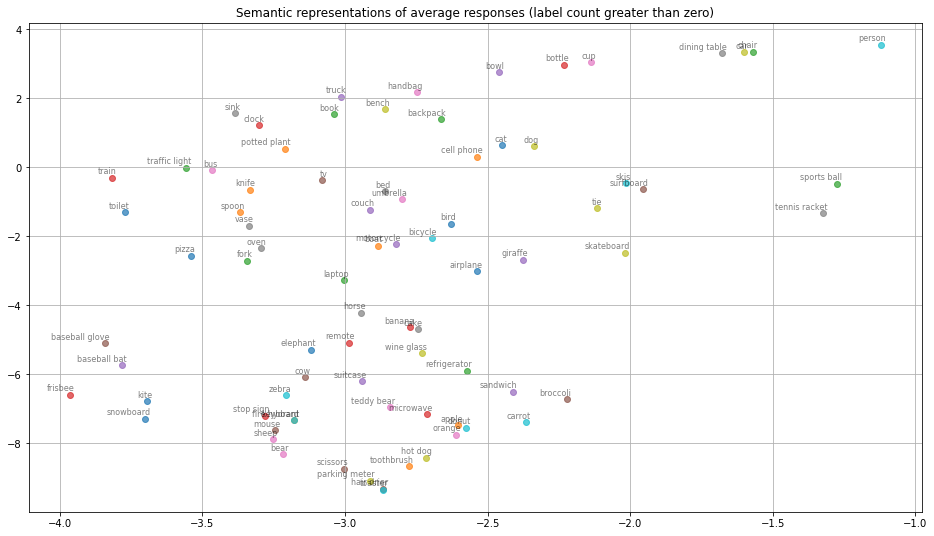

In [16]:
#average response for 
average_response_maps = load_from_nii('average_response_maps.nii')
vectorized_arm = average_response_maps.reshape(81*104*83, 80).transpose()
pca = PCA(n_components=80)
pca.fit(vectorized_arm)
representations_2 = pca.transform(vectorized_arm)
X_embedded_2 = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(representations_2)
tsne_plot_similar_words('Semantic representations of average responses (label count greater than zero)', all_labels, X_embedded_2, 0.7)

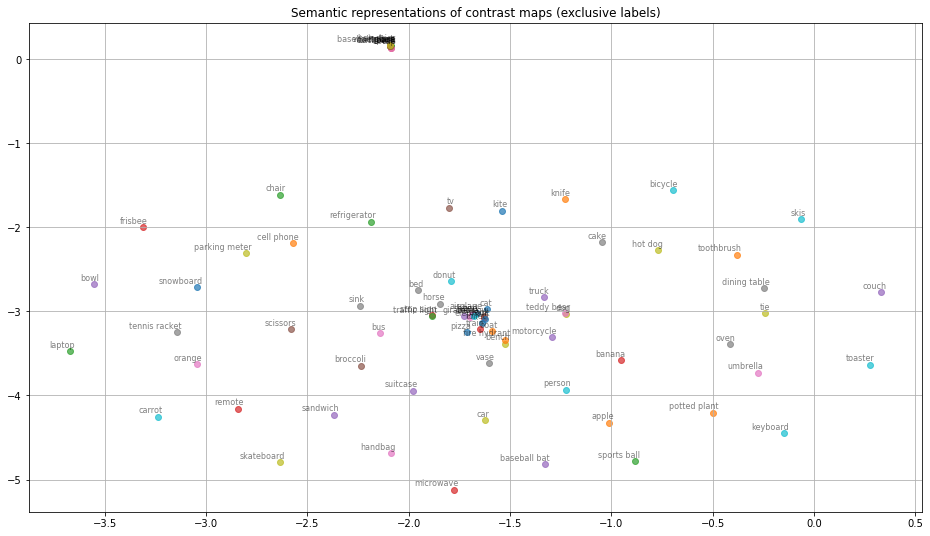

In [17]:
exclusive_label_contrast_maps = load_from_nii('exclusive_label_contrast_maps.nii')
vectorized_elcm = exclusive_label_contrast_maps.reshape(81*104*83, 80).transpose()
pca = PCA(n_components=80)
pca.fit(vectorized_elcm)
representations_3 = pca.transform(vectorized_elcm)
X_embedded_3 = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(representations_3)
tsne_plot_similar_words('Semantic representations of contrast maps (exclusive labels)', all_labels, X_embedded_3, 0.7)

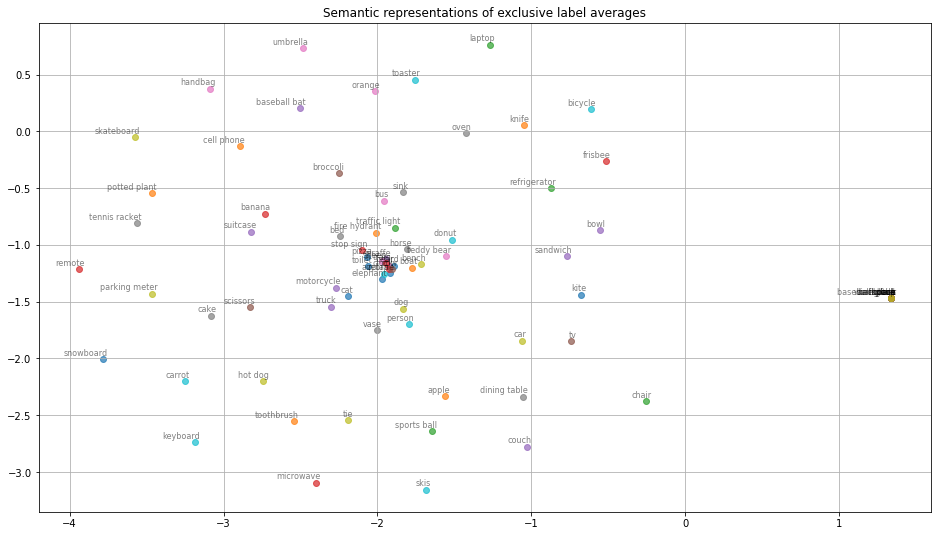

In [18]:
exclusive_label_averages = load_from_nii('exclusive_label_averages.nii')
vectorized_ela = exclusive_label_averages.reshape(81*104*83, 80).transpose()
pca = PCA(n_components=80)
pca.fit(vectorized_ela)
representations_4 = pca.transform(vectorized_ela)
X_embedded_4 = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(representations_4)
tsne_plot_similar_words('Semantic representations of exclusive label averages', all_labels, X_embedded_4, 0.7)

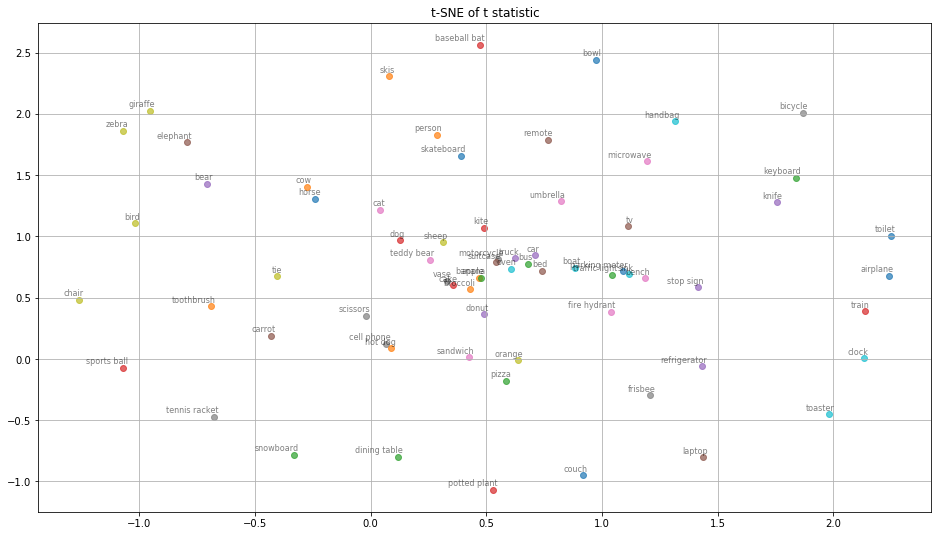

In [17]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
discard = []
for i in range(80):
    if totals[all_labels[i]] == 0:
        discard.append(i)
clean_t_statistic = np.delete(t_statistic, discard, axis=3)
vectorized_t = clean_t_statistic.reshape(81*104*83, clean_t_statistic.shape[3]).transpose()
pca = PCA(n_components=50)
pca.fit(vectorized_t)
representations_5 = pca.transform(vectorized_t)
X_embedded_5 = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(representations_5)
tsne_plot_similar_words('t-SNE of t statistic', [i for i in all_labels if totals[i] != 0], X_embedded_5, 0.7)

Dig into theory: is it possible that additive constant meaningless for tsne?

Idea: learning the voxel decoding using word embedding as training signal
-> Rather than PCA, then linear decoding, why not learn nonlinear dimensionality reduction

## Additive compositionality hypothesis

In [33]:
def nearest_neighbor(brain_vector):
    brain_vector = brain_vector.flatten()
    distances = np.ones(10)*999999999999999999999
    indices = np.zeros(10)
    for session in range(40):
        #start = time.time()
        session += 1
        if session < 10:
            loaded_data = load_from_nii("betas/subj0"+str(subject)+"/betas_session0"+str(session)+".nii")
        else:
            loaded_data = load_from_nii("betas/subj0"+str(subject)+"/betas_session"+str(session)+".nii")
        for trial in range(750):
            dist = scipy.spatial.distance.cosine(loaded_data[:,:,:,trial].flatten(), brain_vector)
            #np.linalg.norm(loaded_data[:,:,:,trial] - brain_vector)
            idx = 750*(session-1) + trial
            for n in range(10):
                if dist < distances[n]:
                    distances[n] = dist
                    indices[n] = idx
                    break
        #print(time.time() - start)
    indices = indices.astype('int')
    return distances, indices

8.47033953666687
8.986529111862183
7.723803997039795
7.598161935806274
7.60427713394165
7.676671981811523
7.714935064315796
7.580053806304932
7.858758211135864
7.653006553649902
8.0819091796875
7.547086954116821
7.914315462112427
7.601485252380371
7.87427544593811
7.554975271224976
7.752845048904419
7.519549131393433
7.7500224113464355
7.521441698074341
7.687046527862549
7.62412166595459
7.9406750202178955
7.586703300476074
7.8683319091796875
7.593618631362915
7.799587726593018
7.3986852169036865
7.404793739318848
7.226759195327759
7.378819704055786
7.1469128131866455
7.350383520126343
7.208661794662476
7.386568546295166
7.259477376937866
7.4305031299591064
7.31508469581604
7.424121618270874
7.150611162185669


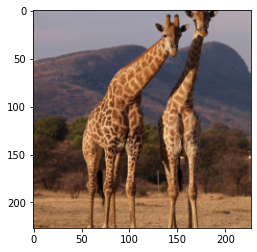

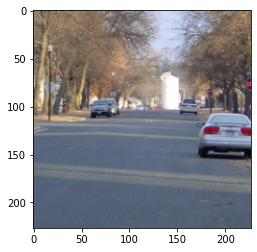

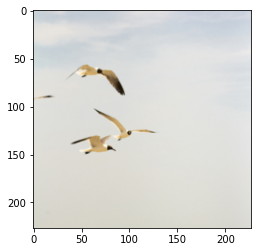

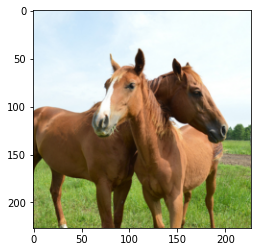

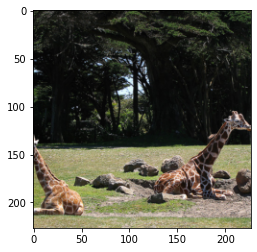

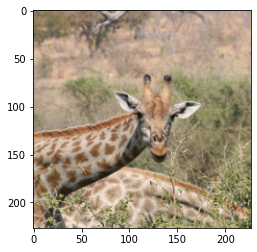

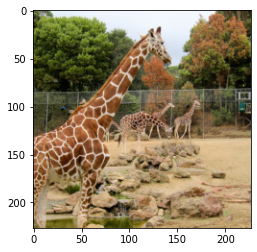

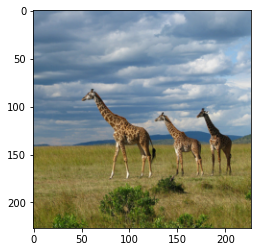

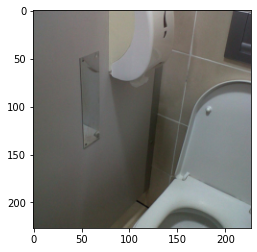

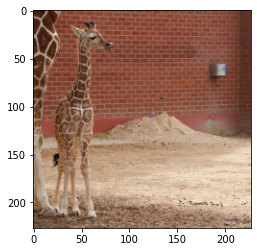

In [22]:
dists, idxs = nearest_neighbor(exclusive_label_contrast_maps[:,:,:,all_labels.index('giraffe')])
for idx in idxs:
    plt.imshow(index_to_image(idx))
    plt.show()

5.093335866928101
4.863970756530762
5.031536817550659
4.801628351211548
4.935087203979492
4.760408163070679
4.893714666366577
4.711428642272949
4.8426833152771
4.693725347518921
4.808207750320435
4.672999143600464
4.772496223449707
4.653241157531738
4.739868640899658
4.641216993331909
4.718290090560913
4.6394829750061035
4.700427293777466
4.620980978012085
4.685903787612915
4.626024484634399
4.676736116409302
4.615759372711182
4.663713455200195
4.615536212921143
4.653977394104004
4.6186065673828125
4.648219585418701
4.606992721557617
4.647176027297974
4.606062412261963
4.63456392288208
4.607682704925537
4.633194446563721
4.60642409324646
4.634933710098267
4.609021902084351
4.630491256713867
4.605961561203003


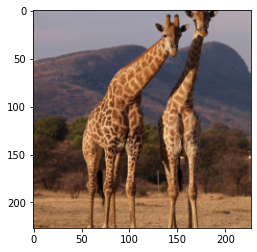

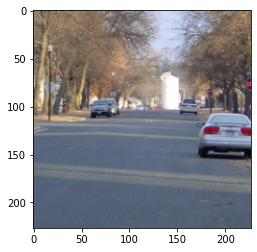

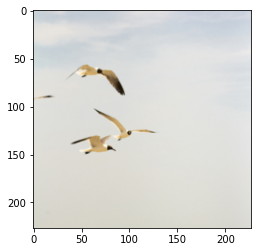

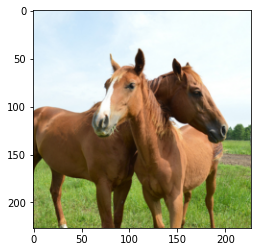

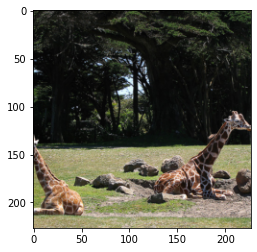

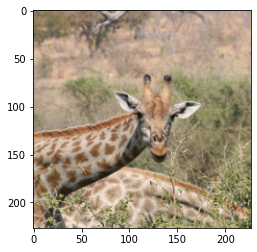

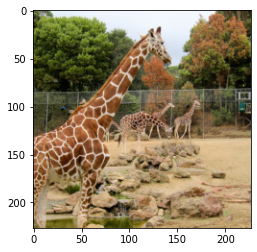

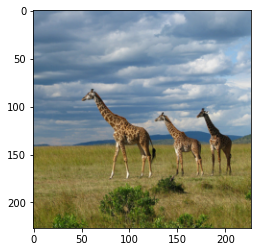

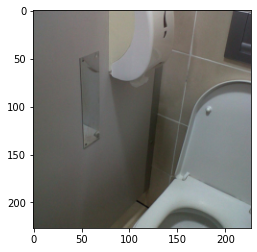

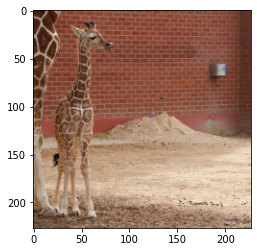

In [52]:
dists, idxs = nearest_neighbor(exclusive_label_contrast_maps[:,:,:,all_labels.index('giraffe')])
for idx in idxs:
    plt.imshow(index_to_image(idx))
    plt.show()

In [53]:
idxs

array([ 8843,  8887,  8888,  8954, 15066, 13142, 28870, 29769, 29566,
       29787])

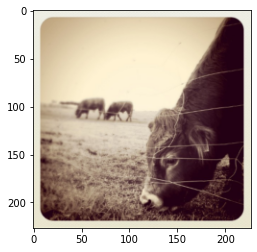

In [22]:
plt.imshow(index_to_image(8886))
plt.show()

4.651033639907837
5.237719535827637
4.67035698890686
5.120635032653809
4.668752670288086
5.027978181838989
4.667325258255005
4.97012996673584
4.659242630004883
4.909242630004883
4.6572325229644775
4.859506130218506
4.646843910217285
4.827022075653076
4.65824818611145
4.798216104507446
4.66045880317688
4.772773027420044
4.656622886657715
4.761059045791626
4.659786701202393
4.739286661148071
4.658825397491455
4.727621078491211
4.655754327774048
4.718862771987915
4.659304141998291
4.709444999694824
4.6562628746032715
4.710627794265747
4.658786058425903
4.703535079956055
4.659076452255249
4.69389009475708
4.655134916305542
4.691729307174683
4.660786390304565
4.696739673614502
4.657268047332764
4.688507795333862


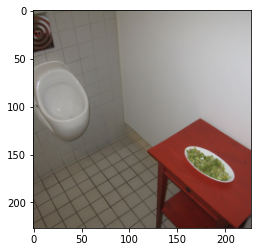

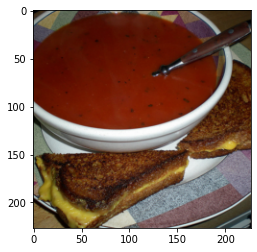

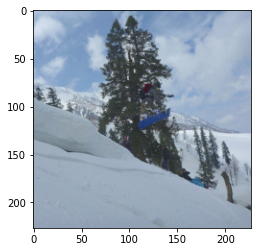

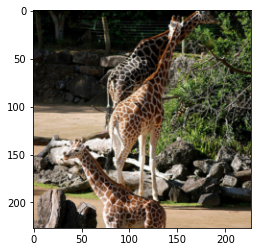

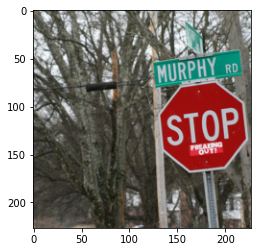

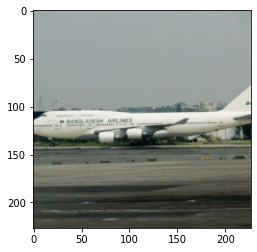

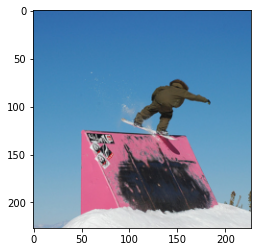

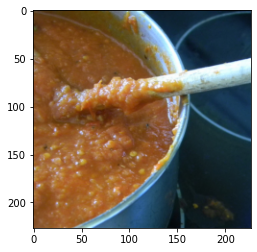

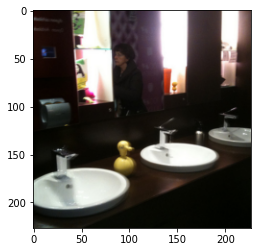

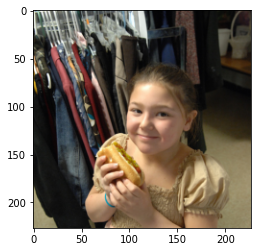

In [49]:
session_1 = load_from_nii('betas/subj01/betas_session01.nii')
dists, idxs = nearest_neighbor(session_1[:,:,:,122])
for idx in idxs:
    plt.imshow(index_to_image(idx))
    plt.show()

In [45]:
idxs

array([120, 121,  96, 117, 147, 311, 377, 275, 442, 678])

In [48]:
idxs

array([121, 122, 123, 126, 154, 213, 265, 316, 381, 734])

In [51]:
idxs

array([  122,   123,   124,   126,  5372,   269, 22204, 22205, 11113,
        4129])

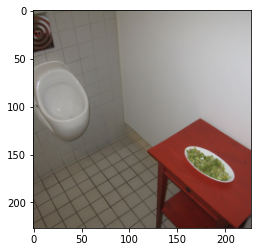

In [50]:
plt.imshow(index_to_image(122))
plt.show()

For voxels at trial i, the two nearest neighbors (using cosine distance) are almost always the voxels at trials i+1 and i+2, despite those corresponding to completely different images. In addition, the top 10 neighbors are almost always voxels from within the same session. In other words—the betas seem highly dependent on the state of the brain from the previous two images and on the session of the scan, more so than they are on the actual stimulus. Use some sort of GSR or use predicted activations?

### Additivity

20.100463390350342
19.319069623947144
18.058510303497314
19.337857723236084
20.102784872055054
17.514342784881592
19.95624828338623
20.62506365776062
20.705114603042603
24.03194808959961
23.86441445350647
19.860922813415527
19.94635510444641
20.9754056930542
18.781389236450195
22.22241711616516
19.818334579467773
19.248449087142944
20.121273517608643
19.435716152191162
18.949913263320923
17.070176601409912
19.725992918014526
18.372830390930176
18.434079885482788
16.016752004623413
17.060225009918213
21.857166051864624
22.914441108703613
22.599083185195923
22.659833669662476
23.18446183204651
21.572125673294067
21.806999444961548
22.27680730819702
21.753808736801147
24.548184394836426
22.478296518325806
21.8463933467865
20.98633599281311


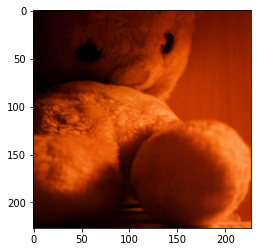

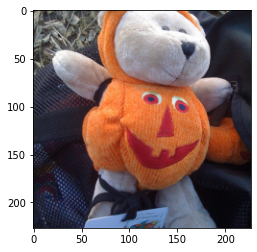

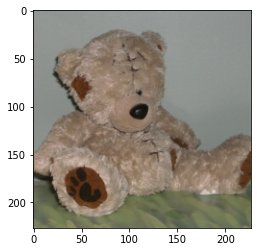

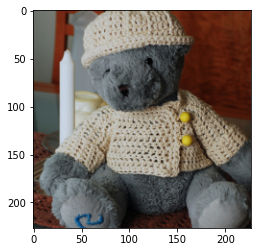

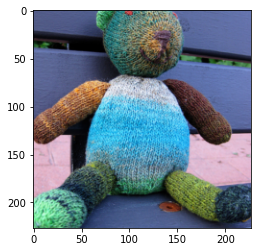

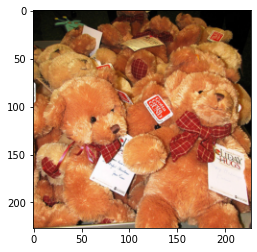

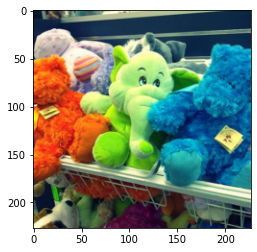

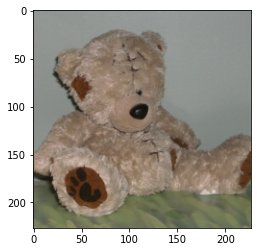

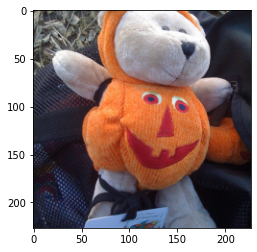

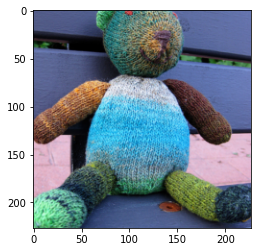

In [44]:
dists, idxs = nearest_neighbor(exclusive_label_contrast_maps[:,:,:,all_labels.index('teddy bear')] + exclusive_label_contrast_maps[:,:,:,all_labels.index('airplane')])
for idx in idxs:
    plt.imshow(index_to_image(idx))
    plt.show()                                                                                                                 

In [45]:
idxs

array([18660, 25364, 29557, 18571, 29763, 25721, 25660, 18209, 25555,
       29428])

9.268956899642944
8.515621423721313
6.699578762054443
5.861324787139893
6.180972337722778
5.988896369934082
5.980113744735718
5.921923398971558
6.081959009170532
5.523010492324829
5.85474705696106
5.518261432647705
5.74585485458374
5.56497597694397
5.827682971954346
5.584903240203857
5.781836748123169
5.5676257610321045
5.7380430698394775
5.573154926300049
5.699663877487183
5.58034873008728
5.678142070770264
5.562652349472046
5.6366167068481445
5.577682971954346
5.682661533355713
5.552777051925659
5.650355815887451
5.535236835479736
5.646393060684204
5.713881969451904
5.576965570449829
5.687437534332275
5.566468715667725
5.521562337875366
5.5456767082214355
5.502895355224609
5.532824516296387
5.510581016540527


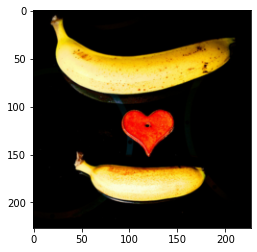

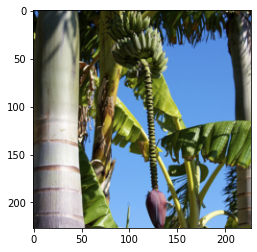

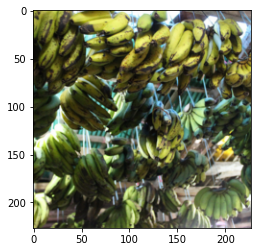

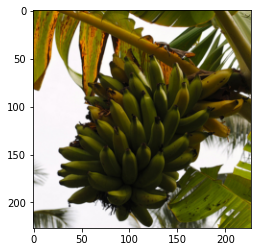

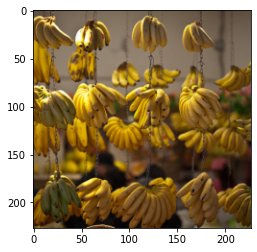

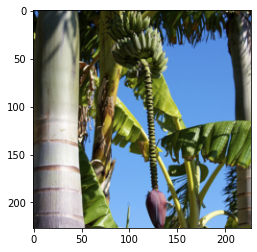

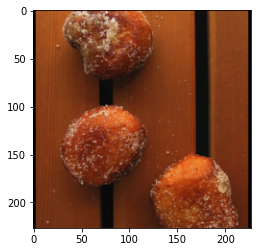

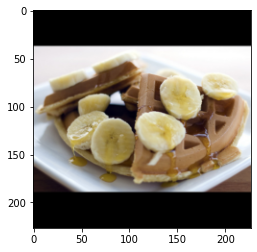

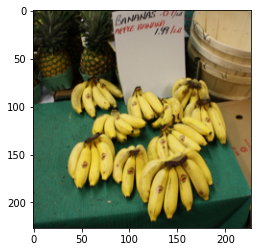

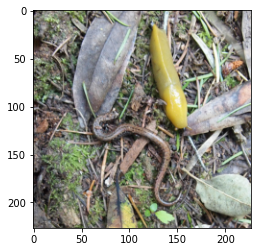

In [63]:
dists, idxs = nearest_neighbor(exclusive_label_contrast_maps[:,:,:,all_labels.index('banana')] + exclusive_label_contrast_maps[:,:,:,all_labels.index('donut')])
for idx in idxs:
    plt.imshow(index_to_image(idx))
    plt.show()         

6.131684303283691
6.819500207901001
6.098175048828125
5.542910099029541
4.947808027267456
5.140324115753174
4.772583961486816
4.9810240268707275
4.64412784576416
4.9093711376190186
4.637264251708984
4.84548020362854
4.629752159118652
4.810439586639404
4.624983787536621
4.765470266342163
4.643662452697754
4.737173318862915
4.632939577102661
4.699801206588745
4.701717853546143
4.964383840560913
4.651227712631226
4.675381898880005
4.632850885391235
4.66636323928833
4.641510009765625
4.650087356567383
4.646392345428467
4.893269062042236
4.7537314891815186
4.74696159362793
4.76166296005249
4.745325803756714
4.753986597061157
4.743957281112671
4.751700162887573
4.758740663528442
4.76904821395874
4.739484548568726


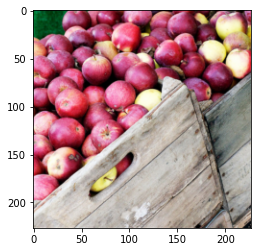

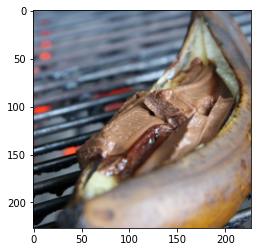

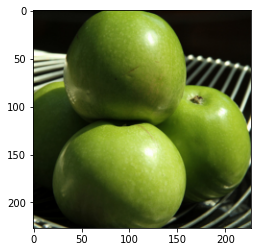

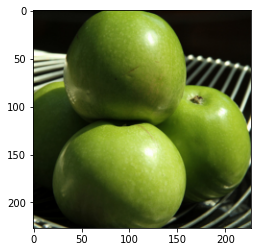

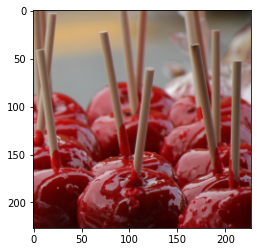

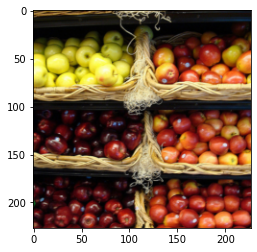

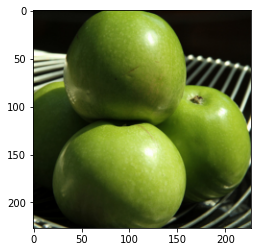

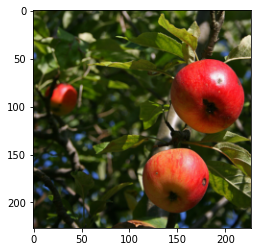

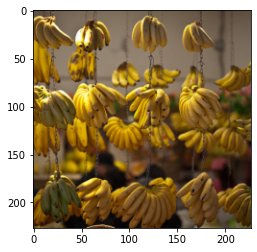

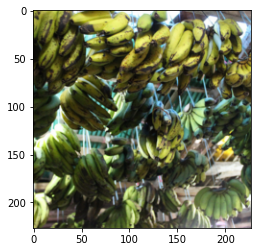

In [66]:
dists, idxs = nearest_neighbor(exclusive_label_contrast_maps[:,:,:,all_labels.index('banana')] + exclusive_label_contrast_maps[:,:,:,all_labels.index('apple')])
for idx in idxs:
    plt.imshow(index_to_image(idx))
    plt.show()     

11.940863370895386
35.774789333343506
28.024855375289917
26.253723859786987
31.42154622077942
28.664812326431274
32.90376567840576
30.270466327667236
29.487067699432373
28.592944860458374
27.28415322303772
25.63996696472168
30.21078896522522
29.149489879608154
28.60340118408203
30.500153064727783
28.989423990249634
30.314196348190308
30.93051791191101
25.916035175323486
30.038069248199463
27.03429913520813
27.9505672454834
26.892044067382812
26.34970474243164
25.27066683769226
23.8813955783844
27.15279531478882
27.90291142463684
31.017530918121338
26.7153639793396
25.205209255218506
27.568395137786865
24.011600971221924
25.06622314453125
25.828221321105957
28.01784038543701
29.379552841186523
28.207072257995605
27.82504940032959


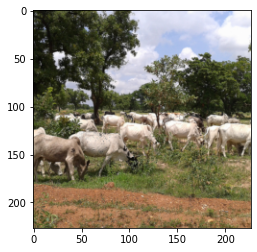

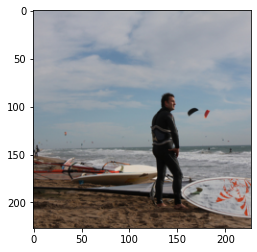

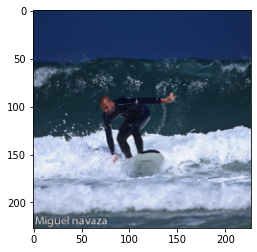

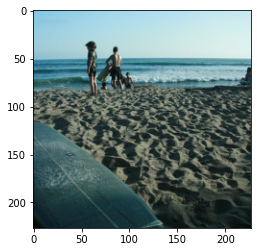

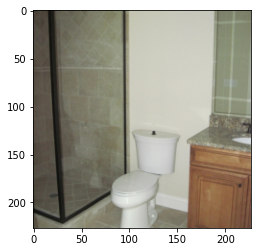

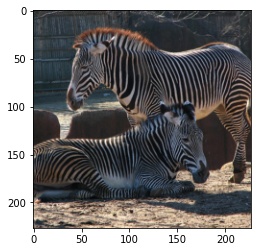

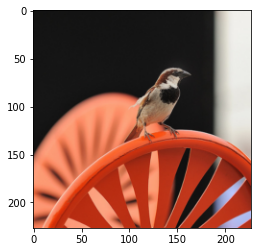

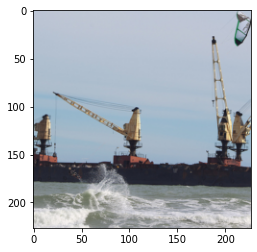

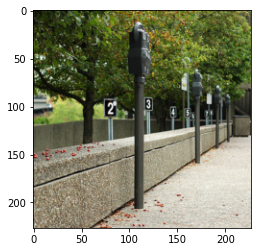

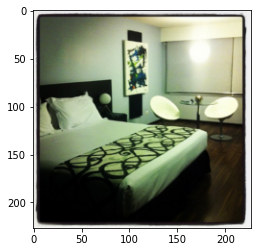

In [123]:
dists, idxs = nearest_neighbor(t_statistic[:,:,:,all_labels.index('banana')] + t_stat[:,:,:,all_labels.index('apple')])
for idx in idxs:
    plt.imshow(index_to_image(idx))
    plt.show()     

7.397362470626831
7.032367944717407
6.98415207862854
6.978309154510498
6.954022407531738
6.973140478134155
6.908796787261963
6.996383905410767
7.937733173370361
7.203421592712402
7.051149606704712
8.25907039642334
7.664127349853516
8.755251169204712
9.823071479797363
7.5425684452056885
7.136352062225342
8.127488136291504
8.965860605239868
7.695147275924683
10.490959644317627
9.294378519058228
8.39441442489624
7.385870695114136
7.3822596073150635
7.539653062820435
7.249082565307617
7.453385591506958
8.201332569122314
8.546684503555298
8.550854444503784
7.523534059524536
7.094564199447632
7.0766496658325195
6.986757278442383
6.778711557388306
6.386783599853516
6.1600096225738525
6.052385568618774
6.037342309951782


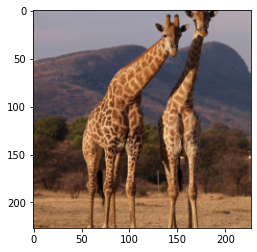

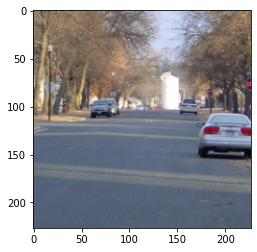

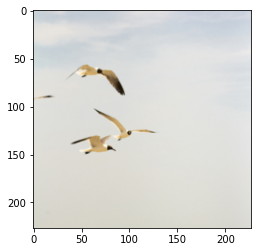

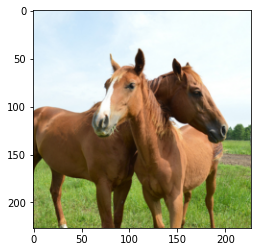

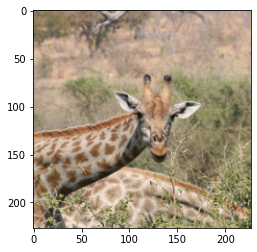

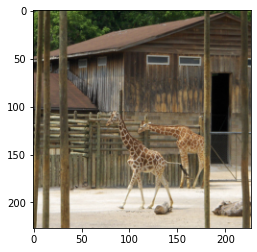

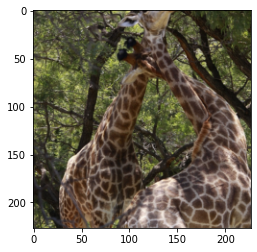

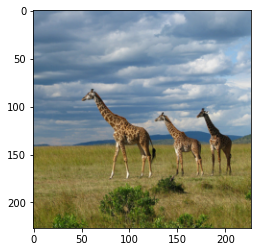

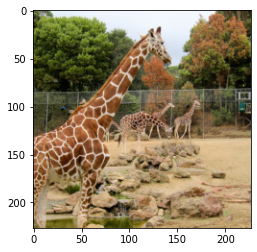

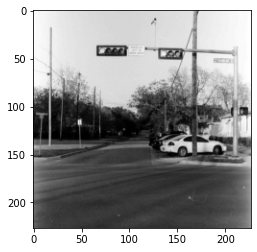

In [124]:
dists, idxs = nearest_neighbor(t_statistic[:,:,:,all_labels.index('giraffe')])
for idx in idxs:
    plt.imshow(index_to_image(idx))
    plt.show()     

Definitely a bias towards 'banana-like apples' and 'apple-like bananas' though it misses on the images that explicitly have apples and bananas together (which do exist)

In [70]:
#number = 0
#for i in range(30000):
#    counter = index_to_label(i)
#    if counter['apple'] > 0 and counter['banana'] > 0:
#        plt.imshow(index_to_image(i))
#        plt.show()
#        number += 1
#print(number)

5.612168550491333
4.969919681549072
5.348712682723999
4.785108804702759
5.155934810638428
4.7607200145721436
5.059136390686035
4.7293806076049805
5.003528833389282
4.719684362411499
4.9200944900512695
4.668836832046509
4.847207546234131
4.653107166290283
4.803886890411377
4.658063650131226
4.765082359313965
4.686574220657349
4.750741720199585
4.669562101364136
4.720501899719238
4.6968910694122314
4.710983753204346
5.645060062408447
4.696788549423218
4.7436323165893555
4.690638542175293
4.658450126647949
4.677226781845093
4.666155815124512
4.667441368103027
4.655250072479248
4.663170337677002
4.647702932357788
4.663058757781982
4.646113872528076
4.656891584396362
4.638225555419922
4.653163194656372
4.643674612045288


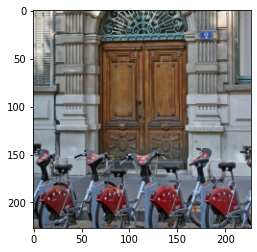

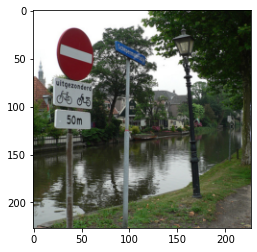

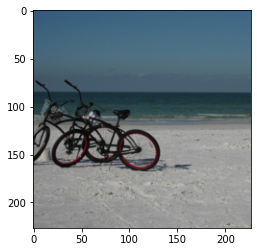

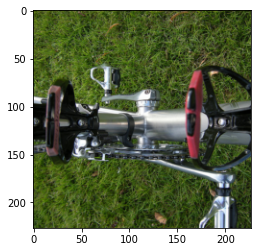

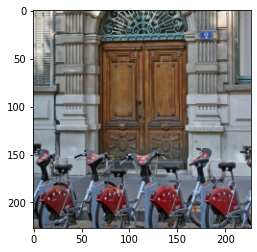

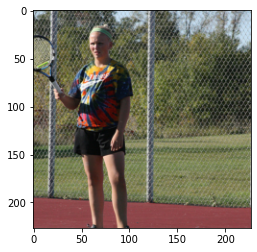

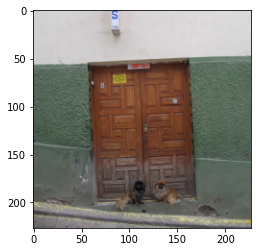

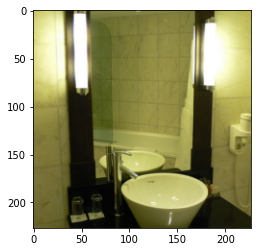

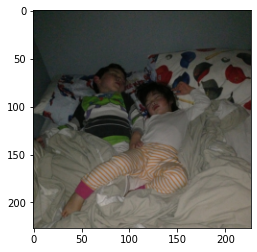

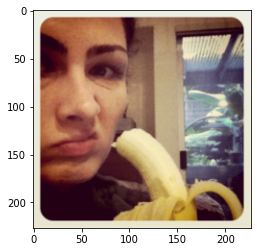

In [71]:
dists, idxs = nearest_neighbor(exclusive_label_contrast_maps[:,:,:,all_labels.index('dog')] + exclusive_label_contrast_maps[:,:,:,all_labels.index('bicycle')])
for idx in idxs:
    plt.imshow(index_to_image(idx))
    plt.show()

Can't get very precise semantic additions if restricted to contrast maps. Maybe try visual or text encoding model. Search space will be too noisy otherwise.

$semantic(A+B) \approx semantic(A) + semantic(B)$

$\frac{mean(dog) - mean(not dog)}{\sqrt{\frac{variance(dog)}{n_1} + \frac{variance(not dog)}{n_2}}}$

https://www.emathzone.com/tutorials/basic-statistics/combined-variance.html

## Positive condition is one label (not exclusively)

In [26]:
#one_label_average = get_all_contrast_maps(1)
#zero_label_average = get_all_contrast_maps(0)
#one_label_contrast_maps = one_label_average - zero_label_average
#one_label_contrast_nifti = nib.Nifti1Image(one_label_contrast_maps, affine=np.eye(4))
#nib.save(one_label_contrast_nifti, 'one_label_contrast_maps.nii')

# Todo

Nilearn plotting glass brain (figure out MNI transform)

t stat to measure variance among voxels (compute efficiently)

# Exclusive labels

In [9]:
exclusive_label_contrast_maps = load_from_nii('exclusive_label_contrast_maps.nii')

Counter({'giraffe': 600, 'clock': 462, 'zebra': 420, 'airplane': 417, 'bird': 393, 'elephant': 384, 'train': 381, 'toilet': 333, 'cow': 312, 'bear': 282, 'sheep': 219, 'horse': 189, 'pizza': 168, 'stop sign': 156, 'traffic light': 150, 'boat': 147, 'cat': 147, 'bench': 138, 'person': 123, 'dog': 117, 'fire hydrant': 117, 'bed': 108, 'teddy bear': 108, 'donut': 102, 'motorcycle': 102, 'truck': 96, 'vase': 96, 'bus': 90, 'sink': 90, 'broccoli': 69, 'banana': 66, 'scissors': 57, 'suitcase': 57, 'cake': 42, 'car': 42, 'apple': 36, 'kite': 36, 'hot dog': 33, 'oven': 33, 'sandwich': 33, 'cell phone': 30, 'refrigerator': 30, 'parking meter': 24, 'umbrella': 24, 'orange': 21, 'bicycle': 18, 'remote': 18, 'tv': 18, 'carrot': 15, 'skateboard': 15, 'tie': 15, 'keyboard': 12, 'microwave': 12, 'toothbrush': 12, 'bowl': 9, 'frisbee': 9, 'handbag': 9, 'knife': 9, 'skis': 9, 'chair': 6, 'dining table': 6, 'laptop': 6, 'snowboard': 6, 'toaster': 6, 'baseball bat': 3, 'couch': 3, 'potted plant': 3, 'spo

<BarContainer object of 80 artists>

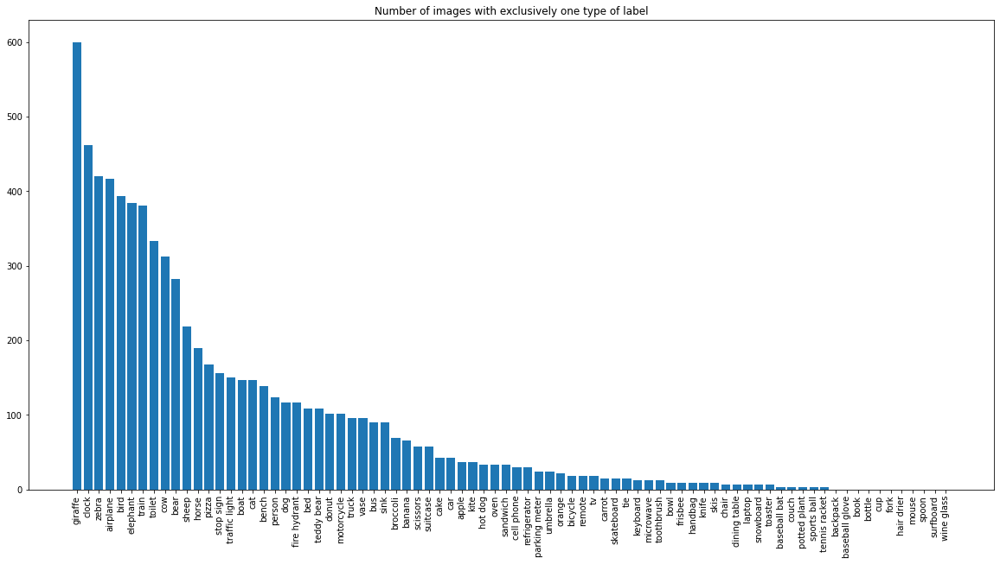

In [67]:
def get_exclusive_labels():    
    keep = []
    for i in range(30000):
        distinct_labels = 0
        for j in range(80):
            if all_counts[j,i] != 0:
                distinct_labels += 1
        if distinct_labels == 1:
            keep.append(i)

    distinct_counts = np.where(all_counts[:,keep] > 0, 1, 0)
    distinct_counts = np.sum(distinct_counts, axis=1)
    totals = collections.Counter()
    for label_index, label in enumerate(all_labels):
        totals[label] = distinct_counts[label_index]
    return keep, totals

keep, totals = get_exclusive_labels()
#totals is a counter that maps labels to number of images with that exclusive label
#keep is a list of indices relative to 30K that give exclusive label trials

plt.figure(figsize=(20,10))
plt.xticks(rotation=90)
print(totals)
xs, ys  = zip(*list(totals.most_common()))
plt.title('Number of images with exclusively one type of label')
plt.bar(xs,ys)

In [24]:
len(keep)

7305

In [11]:
exclusive = np.where(all_counts[:,keep] > 0, 1, 0)
loaded_data_exclusive, loaded_session_exclusive = None, 0

def get_exclusive_label_averages():
    #I think this is averages
    positive_resultant = np.zeros((81,104,83,80))
    global loaded_data_exclusive
    global loaded_session_exclusive
    
    positive_denominators = np.zeros(80)
    for session in range(40):
        start = time.time()
        session = session + 1
        if session != loaded_session_exclusive:
            if session < 10:
                loaded_data_exclusive = load_from_nii("betas/subj0"+str(subject)+"/betas_session0"+str(session)+".nii")
                loaded_session_exclusive = session
            else:
                loaded_data_exclusive = load_from_nii("betas/subj0"+str(subject)+"/betas_session"+str(session)+".nii")
                loaded_session_exclusive = session

        trial_end = 750*session
        trial_start = trial_end - 750
        
        for exclusive_trial in keep:
            indices = np.nonzero(all_counts[:,exclusive_trial])[0]
            if trial_start <= exclusive_trial < trial_end and len(indices) == 1:
                positive_denominators[indices[0]] += 1
                positive_resultant[:,:,:,indices[0]] = positive_resultant[:,:,:,indices[0]] + loaded_data_exclusive[:,:,:,exclusive_trial%750]
        print(time.time() - start)
                    
    positive_resultant = positive_resultant.astype('float')
    
    for label_index in range(80):
        if positive_denominators[label_index] != 0:
            positive_resultant[:,:,:,label_index] = positive_resultant[:,:,:,label_index] / positive_denominators[label_index]

    return positive_resultant

In [12]:
exclusive = np.where(all_counts[:,keep] > 0, 1, 0)
loaded_data_exclusive, loaded_session_exclusive = None, 0

def get_exclusive_variance():
    #should really validate by hand
    accumulated_variance = np.zeros((81,104,83,80))
    accumulated_mean = np.zeros((81,104,83,80))
    global loaded_data_exclusive
    global loaded_session_exclusive
    
    accumulated_sample_size = np.zeros(80)
    for session in range(40):
        start = time.time()
        session = session + 1
        if session != loaded_session_exclusive:
            if session < 10:
                loaded_data_exclusive = load_from_nii("betas/subj0"+str(subject)+"/betas_session0"+str(session)+".nii")
                loaded_session_exclusive = session
            else:
                loaded_data_exclusive = load_from_nii("betas/subj0"+str(subject)+"/betas_session"+str(session)+".nii")
                loaded_session_exclusive = session

        trial_end = 750*session
        trial_start = trial_end - 750
        
        for label in range(80):
            #start2 = time.time()
            collected_trials = []
            for exclusive_trial in keep:
                indices = np.nonzero(all_counts[:,exclusive_trial])[0]
                if label == indices[0] and trial_start <= exclusive_trial < trial_end and len(indices) == 1:
                    exclusive_trial = exclusive_trial % 750
                    collected_trials.append(exclusive_trial)
            relevant_data = loaded_data_exclusive[:,:,:,collected_trials]
            if relevant_data.size != 0: 
                local_variance = np.var(relevant_data, axis=3)
                local_mean = np.mean(relevant_data, axis=3)
                n_1 = accumulated_sample_size[label]
                n_2 = relevant_data.shape[3]
                label_accumulated_mean = accumulated_mean[:,:,:,label]
                combined_mean = (n_1*label_accumulated_mean + n_2*local_mean)/(n_1+n_2)
                accumulated_variance[:,:,:,label] = (n_1*accumulated_variance[:,:,:,label] + n_2*local_variance + n_1*(local_mean-combined_mean)**2 + n_2*(label_accumulated_mean - combined_mean)**2)/(n_1+n_2)
                accumulated_mean[:,:,:,label] = combined_mean
                accumulated_sample_size[label] = n_1+n_2
            #print(time.time() - start2)
        print('ONE WHOLE SESSION FINISHED: '+str(time.time() - start))
    return accumulated_variance

In [49]:
exclusive_variance = get_exclusive_variance()
exclusive_image = nib.Nifti1Image(exclusive_variance, affine=np.eye(4))
nib.save(exclusive_image, 'exclusive_variance.nii')

ONE WHOLE SESSION FINISHED: 9.493517637252808
ONE WHOLE SESSION FINISHED: 7.406648874282837
ONE WHOLE SESSION FINISHED: 8.146888017654419
ONE WHOLE SESSION FINISHED: 8.640256881713867
ONE WHOLE SESSION FINISHED: 8.504093408584595
ONE WHOLE SESSION FINISHED: 8.065662145614624
ONE WHOLE SESSION FINISHED: 8.099908828735352
ONE WHOLE SESSION FINISHED: 8.81176495552063
ONE WHOLE SESSION FINISHED: 8.63275694847107
ONE WHOLE SESSION FINISHED: 10.10712218284607
ONE WHOLE SESSION FINISHED: 8.64220380783081
ONE WHOLE SESSION FINISHED: 8.526387453079224
ONE WHOLE SESSION FINISHED: 10.035054683685303
ONE WHOLE SESSION FINISHED: 8.256818771362305
ONE WHOLE SESSION FINISHED: 8.411479473114014
ONE WHOLE SESSION FINISHED: 9.403444051742554
ONE WHOLE SESSION FINISHED: 15.582692384719849
ONE WHOLE SESSION FINISHED: 10.785614967346191
ONE WHOLE SESSION FINISHED: 9.767685651779175
ONE WHOLE SESSION FINISHED: 8.544599294662476
ONE WHOLE SESSION FINISHED: 9.307146072387695
ONE WHOLE SESSION FINISHED: 10.276

In [23]:
exclusive = np.where(all_counts[:,keep] > 0, 1, 0)
loaded_data_exclusive, loaded_session_exclusive = None, 0

def get_zero_label_variance():
    #should really validate by hand
    accumulated_variance = np.zeros((81,104,83,80))
    accumulated_mean = np.zeros((81,104,83,80))
    global loaded_data_exclusive
    global loaded_session_exclusive
    
    
    
    accumulated_sample_size = np.zeros(80)
    for session in range(40):
        start = time.time()
        session = session + 1
        if session != loaded_session_exclusive:
            if session < 10:
                loaded_data_exclusive = load_from_nii("betas/subj0"+str(subject)+"/betas_session0"+str(session)+".nii")
                loaded_session_exclusive = session
            else:
                loaded_data_exclusive = load_from_nii("betas/subj0"+str(subject)+"/betas_session"+str(session)+".nii")
                loaded_session_exclusive = session

        trial_end = 750*session
        trial_start = trial_end - 750
        
        for label in range(80):
            start2 = time.time()
            collected_trials = []
            for trial in range(30000):
                indices = np.nonzero(all_counts[:,trial])
                reg = []
                for i in indices:
                    reg.append(i[0])
                opp_indices = [i for i in range(80) if i not in reg]
                if label in opp_indices and trial_start <= trial < trial_end:
                    trial = trial % 750
                    collected_trials.append(trial)
            #print(collected_trials)
            relevant_data = loaded_data_exclusive[:,:,:,collected_trials]
            if relevant_data.size != 0: 
                local_variance = np.var(relevant_data, axis=3)
                local_mean = np.mean(relevant_data, axis=3)
                n_1 = accumulated_sample_size[label]
                n_2 = relevant_data.shape[3]
                label_accumulated_mean = accumulated_mean[:,:,:,label]
                combined_mean = (n_1*label_accumulated_mean + n_2*local_mean)/(n_1+n_2)
                accumulated_variance[:,:,:,label] = (n_1*accumulated_variance[:,:,:,label] + n_2*local_variance + n_1*(local_mean-combined_mean)**2 + n_2*(label_accumulated_mean - combined_mean)**2)/(n_1+n_2)
                accumulated_mean[:,:,:,label] = combined_mean
                accumulated_sample_size[label] = n_1+n_2
            print(time.time() - start2)
        print('ONE WHOLE SESSION FINISHED: '+str(time.time() - start))
    return accumulated_variance, accumulated_sample_size

In [17]:
#zero_label_variance, zero_label_sample_size = get_zero_label_variance()
#zero_label_variance_image = nib.Nifti1Image(zero_label_variance, affine=np.eye(4))
#nib.save(zero_label_variance_image, 'zero_label_variance.nii')

#zero_label_ss_image = nib.Nifti1Image(zero_label_sample_size, affine=np.eye(4))
#nib.save(zero_label_ss_image, 'zero_label_sample_size.nii')


exclusive_label_contrast_maps = load_from_nii('exclusive_label_contrast_maps.nii')
exclusive_variance = load_from_nii('exclusive_variance.nii')
a = np.zeros((81,104,83,80))
for i in range(80):
    a[:,:,:,i] = exclusive_variance[:,:,:,i]/totals[all_labels[i]]
    
b = np.zeros((81,104,83,80))
for i in range(80):
    b[:,:,:,i] = zero_label_variance[:,:,:,i]/zero_label_sample_size[i]
    
t_stat = exclusive_label_contrast_maps/((a+b)**.5)

t_stat_image = nib.Nifti1Image(t_stat, affine=np.eye(4))
nib.save(t_stat_image, 't_stat.nii')



/tmp/ipykernel_4423/1845977017.py:13: RuntimeWarning: invalid value encountered in true_divide
  a[:,:,:,i] = exclusive_variance[:,:,:,i]/totals[all_labels[i]]
/tmp/ipykernel_4423/1845977017.py:19: RuntimeWarning: invalid value encountered in true_divide
  t_stat = exclusive_label_contrast_maps/((a+b)**.5)


In [12]:
#Loading quantities
exclusive_variance = load_from_nii('exclusive_variance.nii')
exclusive_sample_size = totals #dict
zero_label_variance = load_from_nii('zero_label_variance.nii')
zero_label_sample_size = load_from_nii('zero_label_sample_size.nii')
exclusive_label_contrast_maps = load_from_nii('exclusive_label_contrast_maps.nii')
t_stat = load_from_nii('t_stat.nii')
t_statistic = load_from_nii('t_statistic.nii')
p_values = load_from_nii('p_values.nii')

<BarContainer object of 80 artists>

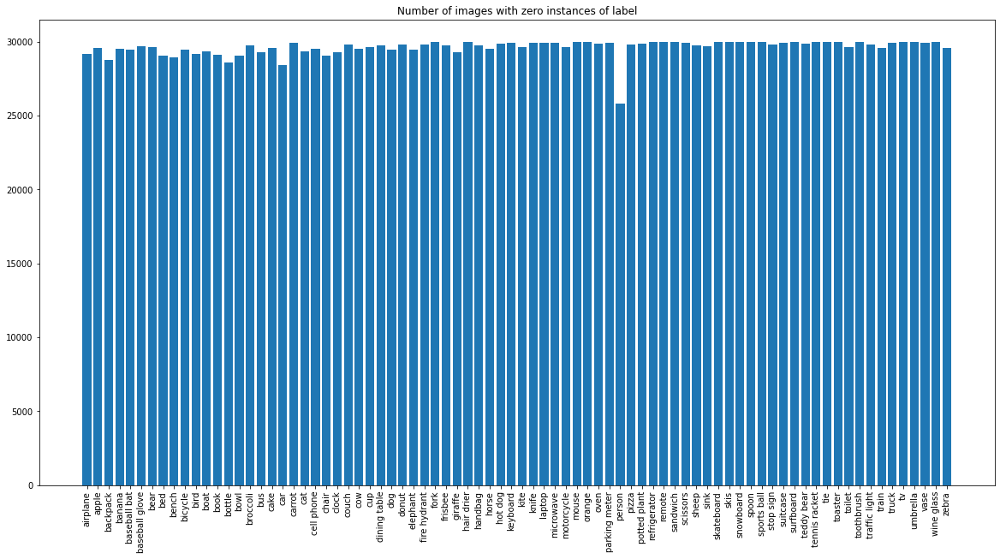

In [10]:
plt.figure(figsize=(20,10))
plt.xticks(rotation=90)
xs, ys  = [all_labels[i] for i in range(80)], zero_label_sample_size
plt.title('Number of images with zero instances of label')
plt.bar(xs,ys)

In [47]:
def get_truth_matrix():
    truth_matrix = np.empty(exclusive_variance.shape)
    for i in range(truth_matrix.shape[0]):
        for j in range(truth_matrix.shape[1]):
            for k in range(truth_matrix.shape[2]):
                for l in range(truth_matrix.shape[3]):
                    truth_matrix[i,j,k,l] = exclusive_variance[i,j,k,l] > 2*zero_label_variance[i,j,k,l] or 2*exclusive_variance[i,j,k,l] < zero_label_variance[i,j,k,l]
    truth_matrix = truth_matrix.astype(bool)
    return truth_matrix

In [58]:
def get_t_stat_2():
    denominator = np.zeros(truth_matrix.shape)
    for label in range(80):
        print(label)
        n_1 = totals[all_labels[label]]
        if n_1 != 0:
            n_2 = zero_label_sample_size[label]
            for i in range(truth_matrix.shape[0]):
                for j in range(truth_matrix.shape[1]):
                    for k in range(truth_matrix.shape[2]):
                        if truth_matrix[i,j,k,label]:
                            var_1 = exclusive_variance[i,j,k,label]
                            var_2 = zero_label_variance[i,j,k,label]
                            denominator[i,j,k,label] = (var_1/n_1 + var_2/n_2)**.5
                        if not truth_matrix[i,j,k,label]:
                            var_1 = exclusive_variance[i,j,k,label]
                            var_2 = zero_label_variance[i,j,k,label]
                            s = (((n_1-1)*var_1 + (n_2-1)*var_2)/(n_1+n_2-2))**.5
                            denominator[i,j,k,label] = s*(1/n_1 + 1/n_2)**.5
    return np.where(denominator != 0, exclusive_label_contrast_maps/denominator, denominator)

In [72]:
t_stat_2_image = nib.Nifti1Image(t_stat_2, affine=np.eye(4))
nib.save(t_stat_2_image, 't_statistic.nii')
t_statistic = load_from_nii('t_statistic.nii')

In [74]:
def get_dof():
    dof = np.zeros(t_statistic.shape)
    for label in range(80):
        print(label)
        n_1 = totals[all_labels[label]]
        if n_1 != 0:
            n_2 = zero_label_sample_size[label]
            for i in range(truth_matrix.shape[0]):
                for j in range(truth_matrix.shape[1]):
                    for k in range(truth_matrix.shape[2]):
                        if truth_matrix[i,j,k,label]:
                            var_1 = exclusive_variance[i,j,k,label]
                            var_2 = zero_label_variance[i,j,k,label]
                            dof[i,j,k,label] = ((var_1/n_1 + var_2/n_2)**2)/(((var_1/n_1)**2)/(n_1-1)+((var_2/n_2)**2)/(n_2-1))
                        if not truth_matrix[i,j,k,label]:
                            dof[i,j,k,label] = n_1 + n_2 - 2
    return dof

In [19]:
#dof = get_dof()

In [79]:
from scipy.stats import t

def get_p_values():
    p_values = np.zeros(t_statistic.shape)
    for i in range(truth_matrix.shape[0]):
        print(i)
        for j in range(truth_matrix.shape[1]):
            for k in range(truth_matrix.shape[2]):
                for l in range(truth_matrix.shape[3]):
                    p_values[i,j,k,l] = t.sf(abs(t_statistic[i,j,k,l]),dof[i,j,k,l])
    return p_values

In [18]:
thresholded = np.where(p_values < .05, t_statistic, 0)

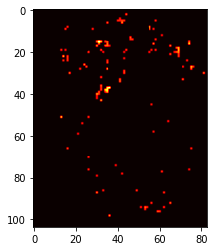

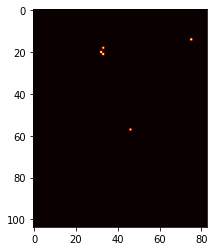

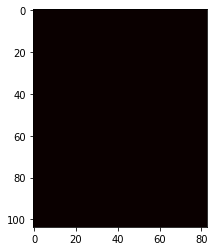

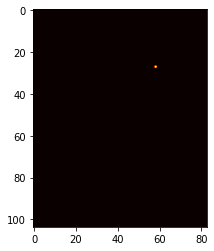

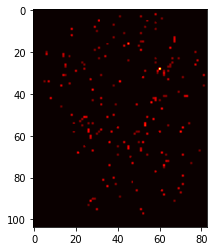

...

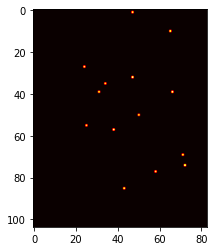

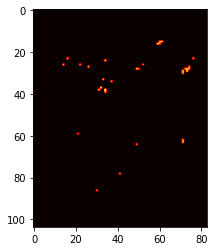

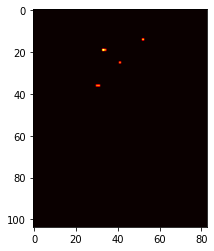

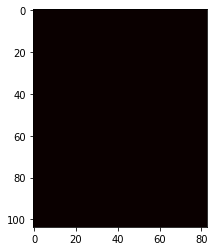

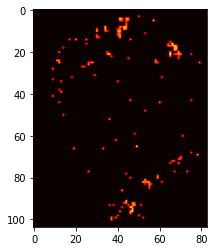

In [119]:
for i in range(80):
    plt.imshow(thresholded[30,:,:,i],vmin=0,cmap='hot')
    plt.show()

airplane - 417


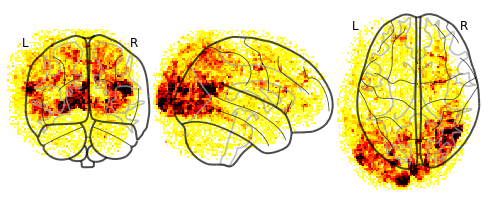

apple - 36


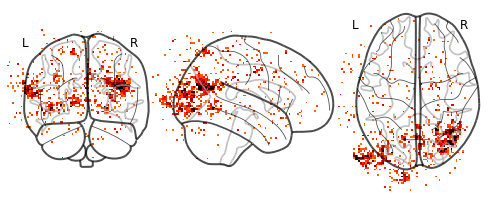

backpack - 0


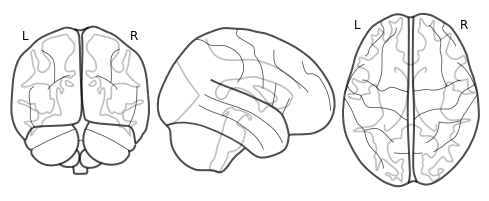

banana - 66


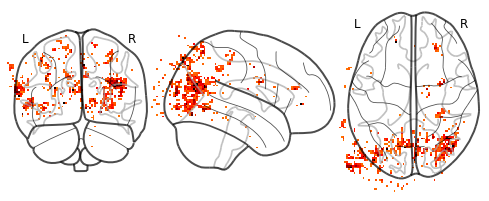

baseball bat - 3


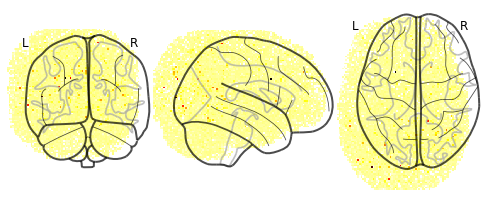

baseball glove - 0


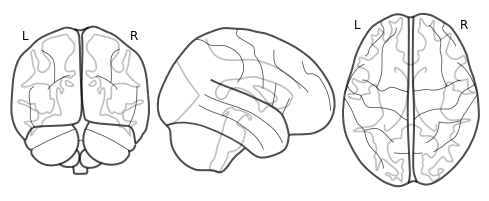

bear - 282


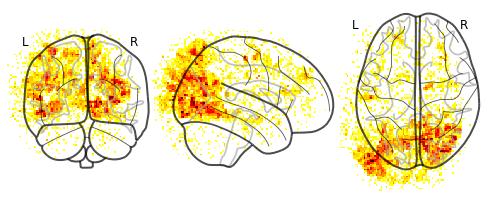

bed - 108


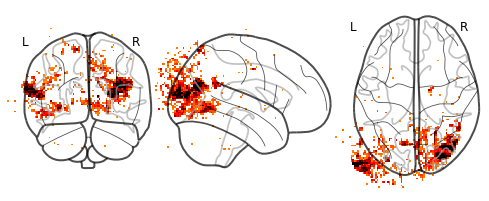

bench - 138


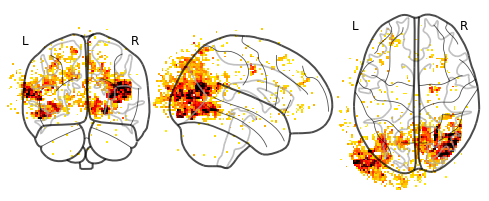

bicycle - 18


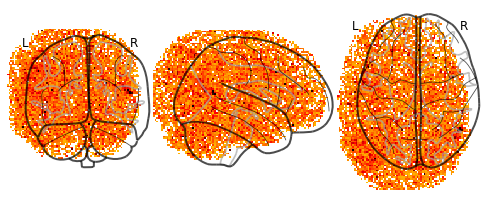

bird - 393


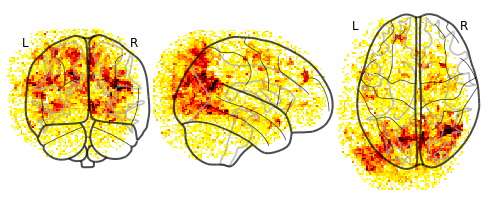

boat - 147


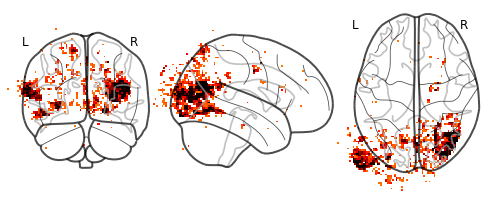

book - 0


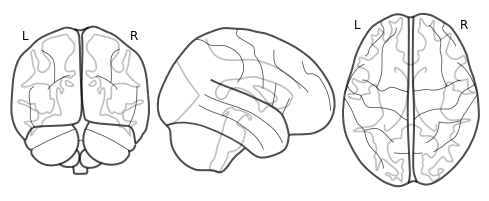

bottle - 0


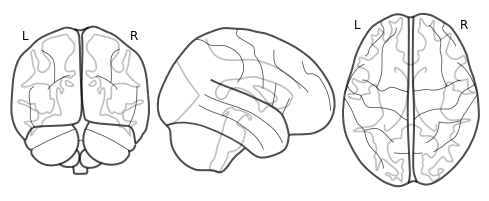

bowl - 9


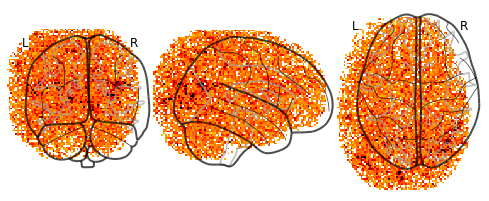

broccoli - 69


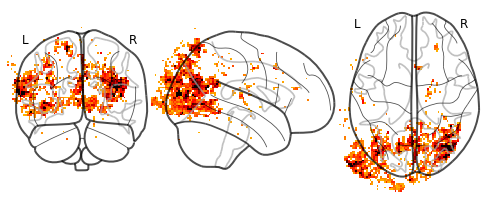

bus - 90


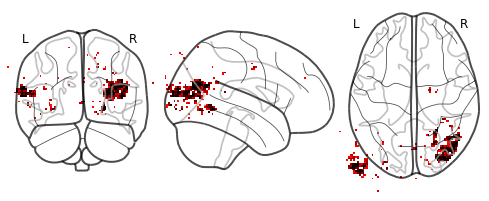

cake - 42


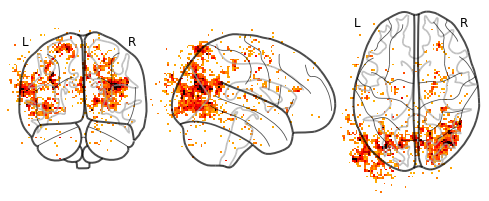

car - 42


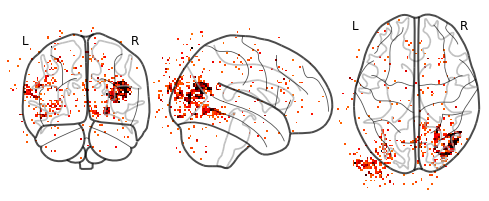

carrot - 15


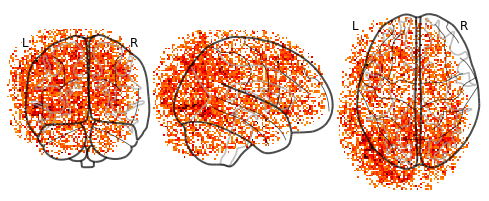

cat - 147


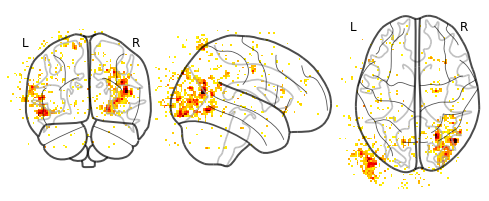

cell phone - 30


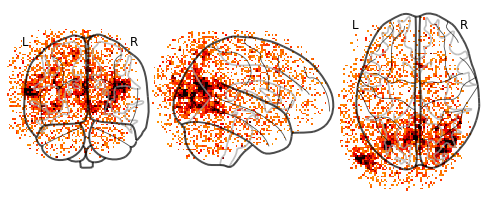

chair - 6


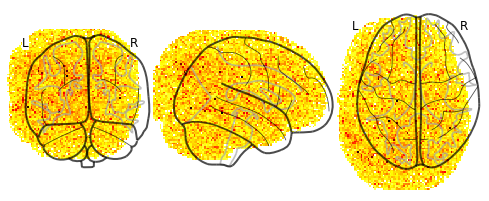

clock - 462


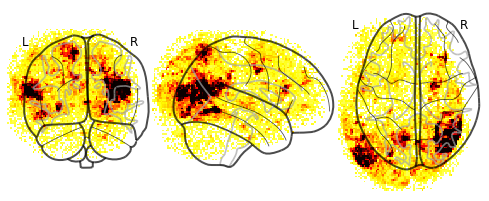

couch - 3


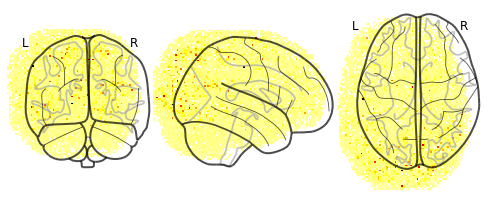

cow - 312


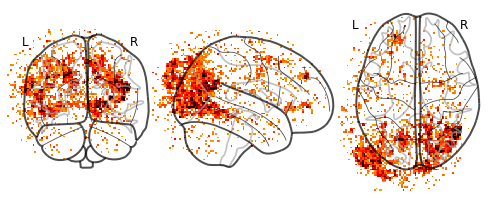

cup - 0


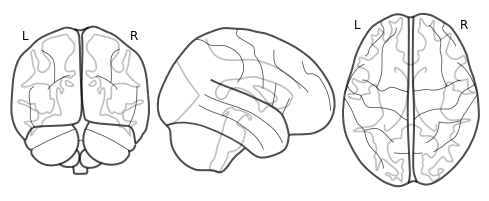

dining table - 6


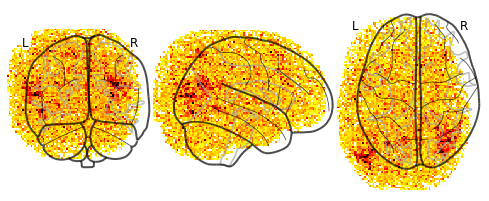

dog - 117


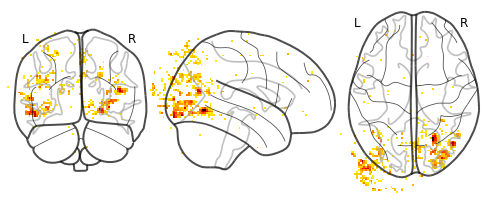

donut - 102


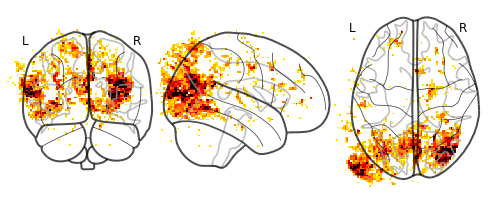

elephant - 384


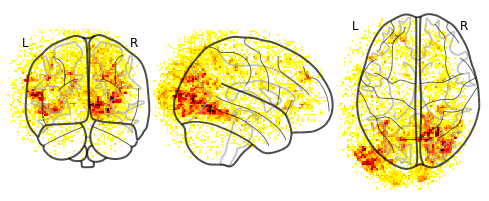

fire hydrant - 117


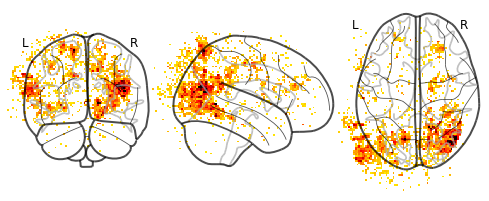

fork - 0


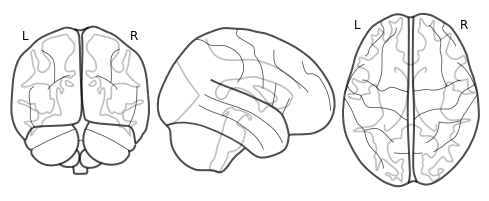

frisbee - 9


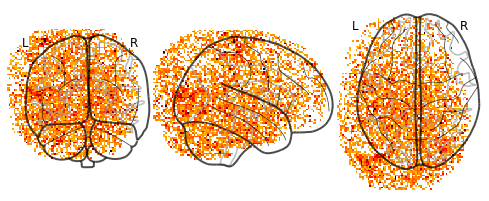

giraffe - 600


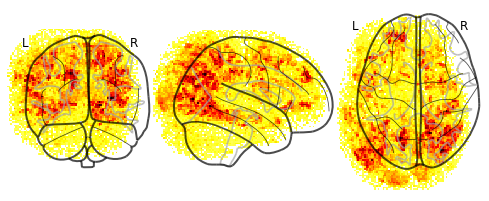

hair drier - 0


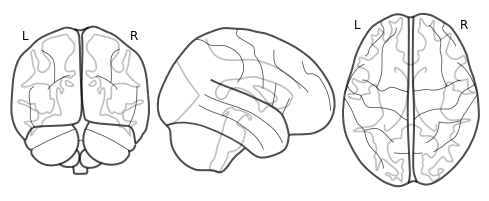

handbag - 9


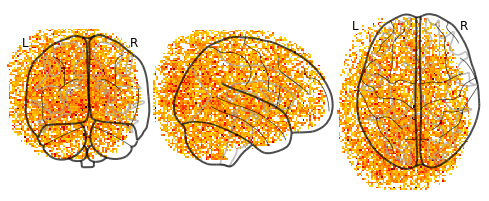

horse - 189


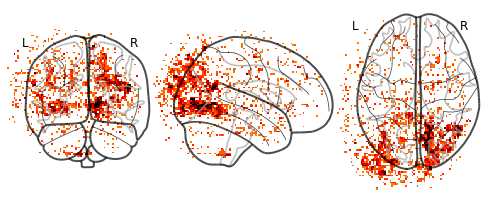

hot dog - 33


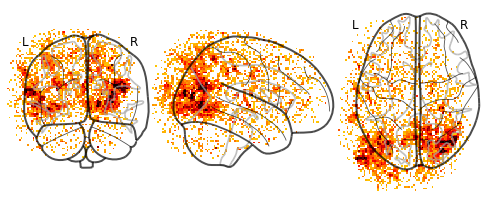

keyboard - 12


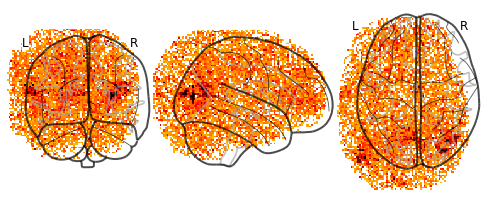

kite - 36


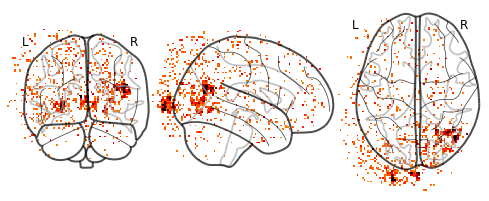

knife - 9


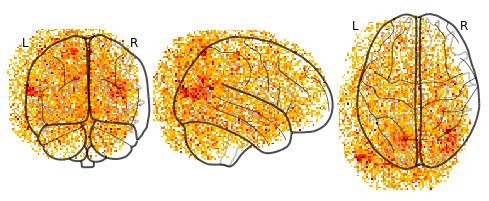

laptop - 6


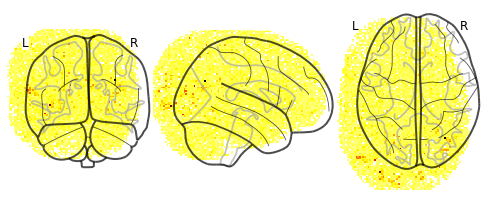

microwave - 12


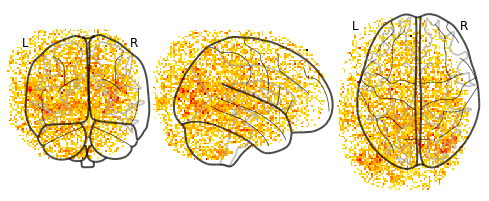

motorcycle - 102


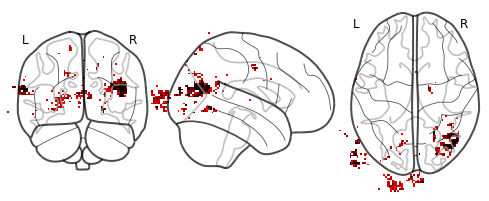

mouse - 0


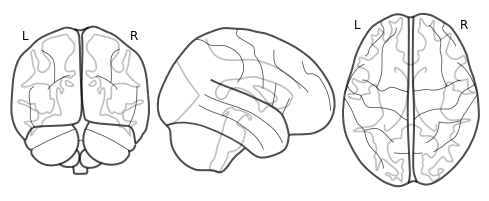

orange - 21


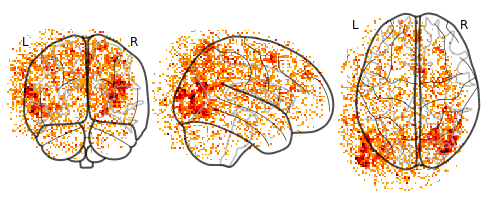

oven - 33


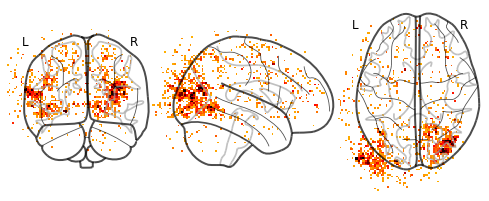

parking meter - 24


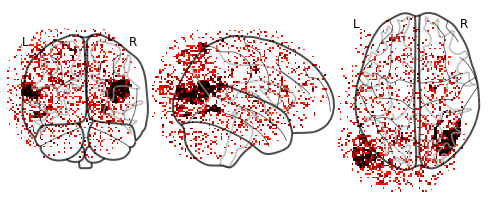

person - 123


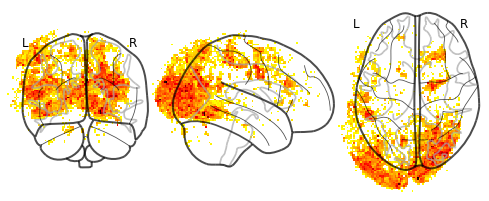

pizza - 168


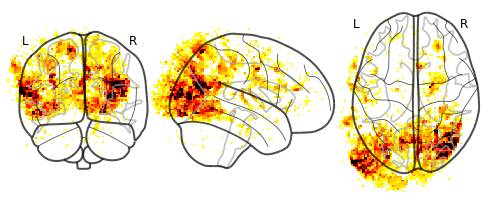

potted plant - 3


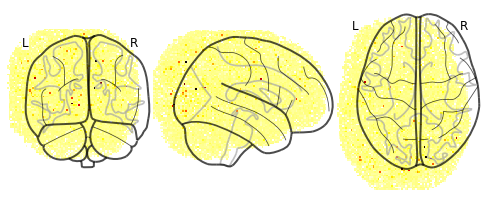

refrigerator - 30


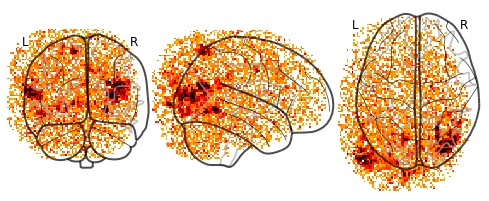

remote - 18


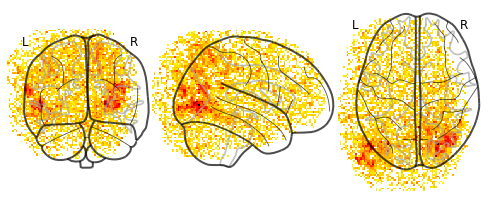

sandwich - 33


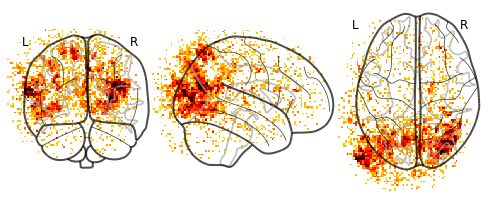

scissors - 57


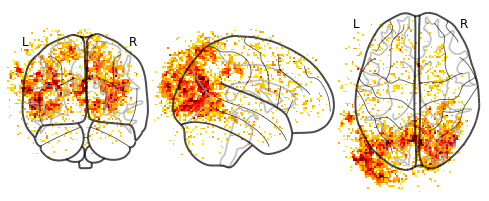

sheep - 219


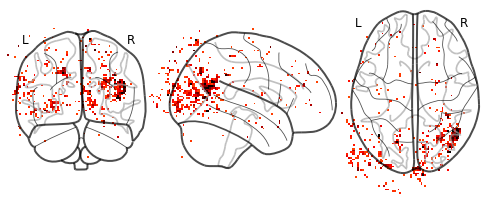

sink - 90


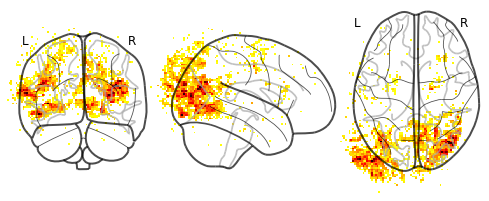

skateboard - 15


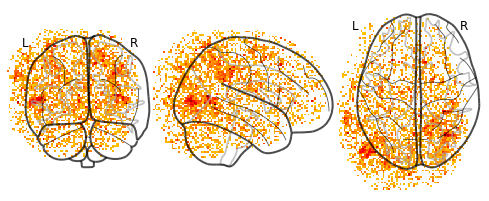

skis - 9


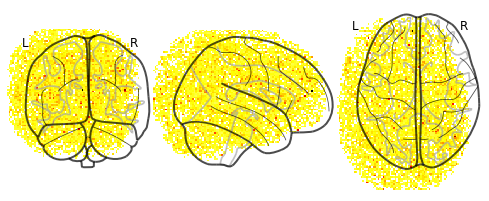

snowboard - 6


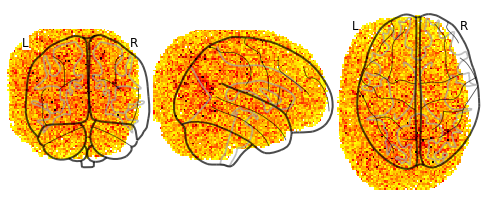

spoon - 0


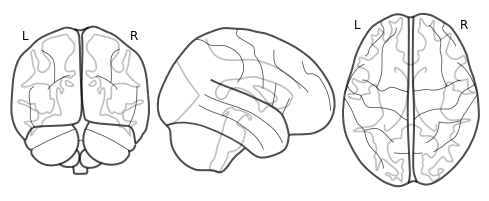

sports ball - 3


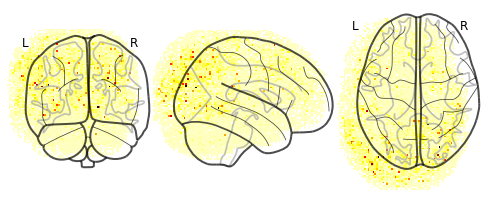

stop sign - 156


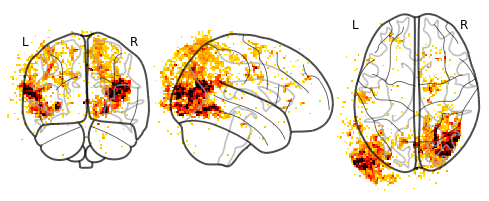

suitcase - 57


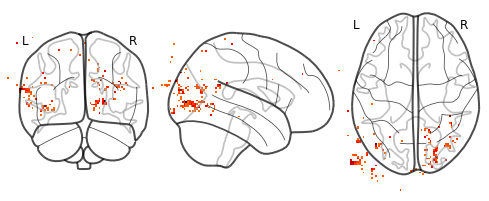

surfboard - 0


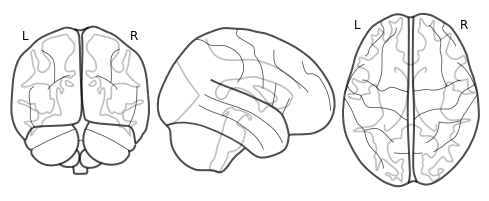

teddy bear - 108


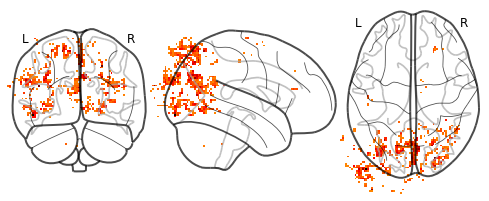

tennis racket - 3


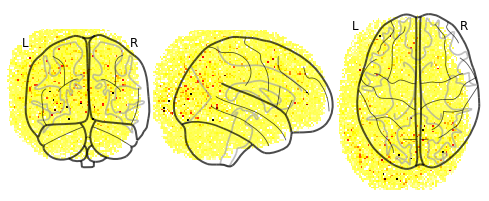

tie - 15


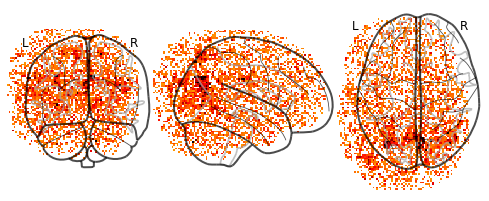

toaster - 6


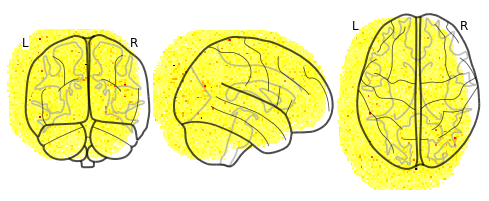

toilet - 333


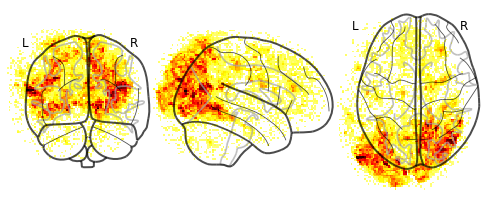

toothbrush - 12


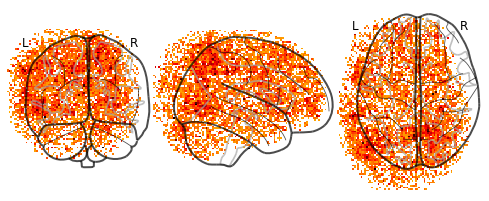

traffic light - 150


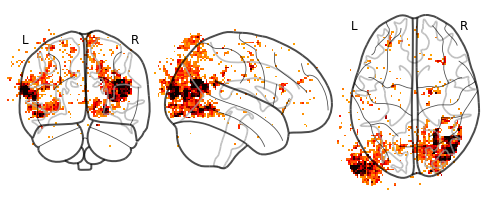

train - 381


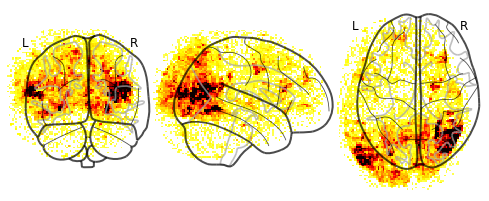

truck - 96


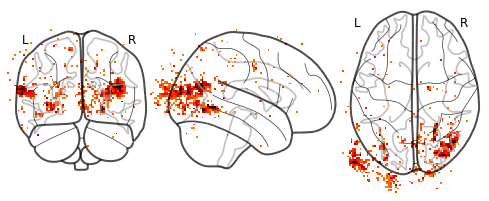

tv - 18


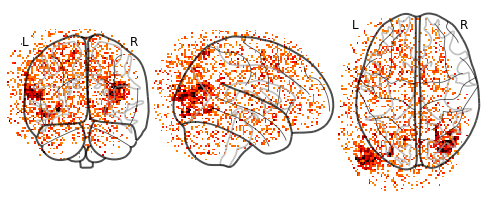

umbrella - 24


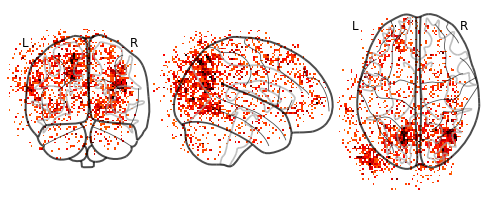

vase - 96


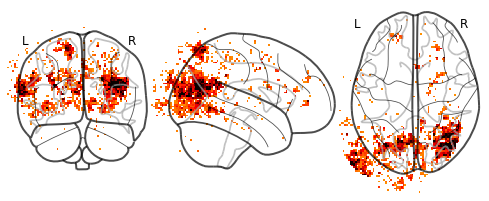

wine glass - 0


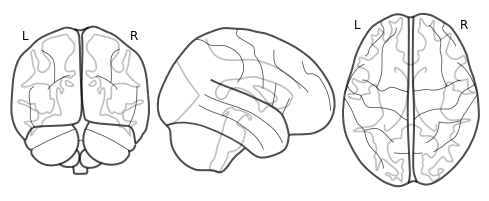

zebra - 420


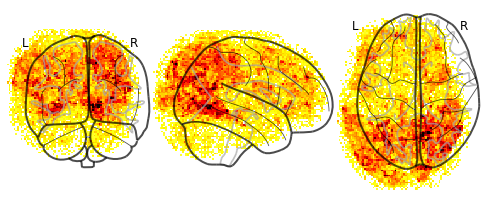

In [122]:
from nilearn import plotting
from nilearn import datasets, image

#from nilearn.image import resample_to_img, load_img
#from nilearn.datasets import load_mni152_template
#for i in range(80):
    #print(all_labels[i])

mni = datasets.load_mni152_template()
for i in range(80):
    print(all_labels[i]+' - '+str(totals[all_labels[i]]))
    label_specific = thresholded[:,:,:,i]
    image = nib.Nifti1Image(label_specific, affine=mni.affine)

#mni = load_mni152_template()

#resampled = resample_to_img(pizza_image, mni)

#mni = datasets.load_mni152_template()
#pizza_image_2.affine = mni.affine.copy()
    plotting.plot_glass_brain(image)
    plt.show()
#plotting.plot_stat_map(pizza_image_2)


In [7]:
index_to_captions(34)

['A hot dog and a pickle on a tray.',
 'A hotdog that is sitting in a bun on a paper.',
 'A hot dog with pickles and tomatoes. ',
 'there is a sandwich with many different foods in it',
 'This is a hot dog with tomato, mustard, onion, relish, and pickle on it.']

# Compositionality

In [84]:
single_label_averages = load_from_nii('exclusive_label_averages.nii')

In [86]:
double_label_averages = load_from_nii('double_label_averages.nii')

In [8]:
# A list of tuples [('airplane','apple'), etc]
def get_label_pairs():
    label_pairs = []
    for i in range(80):
        for j in range(80):
            if i < j:
                label_pairs.append((all_labels[i], all_labels[j]))
    return label_pairs
    
label_pairs = get_label_pairs() #3160

In [9]:
# label_pair_counts is a list where element i contains the count for the ith pair relative to label_pairs
# label_pair_trials is a dict mapping ith pair to a list of indices relative to 30k

def get_label_pair_trials():
    label_pair_counts = []
    label_pair_trials = {}
    for pair in range(3160):
        label_one_idx = all_labels.index(label_pairs[pair][0])
        label_two_idx = all_labels.index(label_pairs[pair][1])
        label_pair_count = 0
        paired_trials = []
        for trial in range(30000):
            if all_counts[label_one_idx, trial] > 0 and all_counts[label_two_idx, trial] > 0:
                label_pair_count += 1
                paired_trials.append(trial)
        label_pair_trials[pair] = paired_trials
        label_pair_counts.append(label_pair_count)
    return label_pair_counts, label_pair_trials

label_pair_counts, label_pair_trials = get_label_pair_trials()

In [58]:
def modified_get_label_pair_trials():
    updated_label_pair_trials = {}
    updated_label_pair_counts = []
    for i in range(3160):
        trials = []
        label_one = label_pairs[i][0]
        label_two = label_pairs[i][1]
        candidate_indices = label_pair_trials[i]
        for idx in candidate_indices:
            label_one_check = False
            label_two_check = False
            captions = index_to_captions(idx)
            for caption in captions:
                if label_one in caption:
                    label_one_check = True
                if label_two in caption:
                    label_two_check = True
            if label_one_check and label_two_check:
                trials.append(idx)
        updated_label_pair_trials[i] = trials
        updated_label_pair_counts.append(len(trials))
    return updated_label_pair_counts, updated_label_pair_trials

updated_label_pair_counts, updated_label_pair_trials = modified_get_label_pair_trials()

<BarContainer object of 3160 artists>

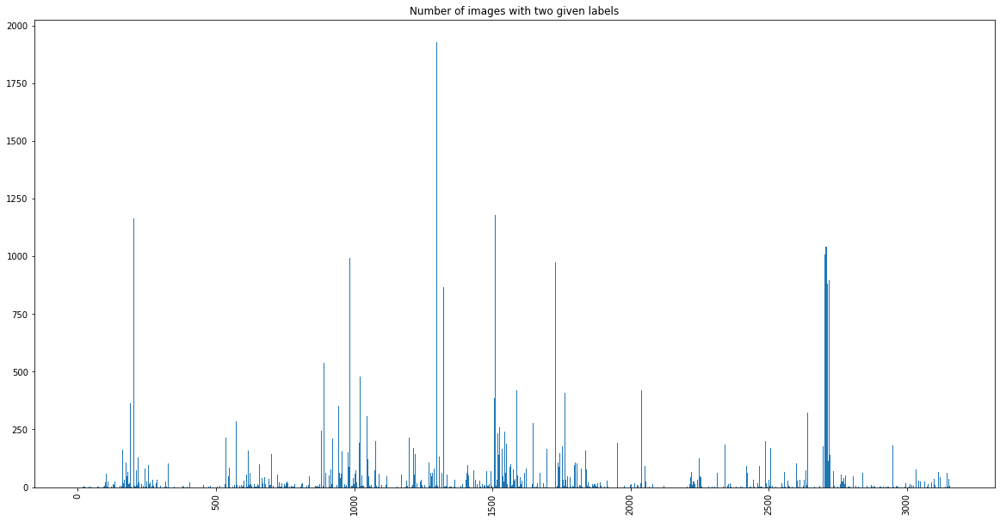

In [53]:
plt.figure(figsize=(20,10))
plt.xticks(rotation=90)
xs, ys  = [i for i in range(3160)], label_pair_counts
plt.title('Number of images with two given labels')
plt.bar(xs,ys)

<BarContainer object of 3160 artists>

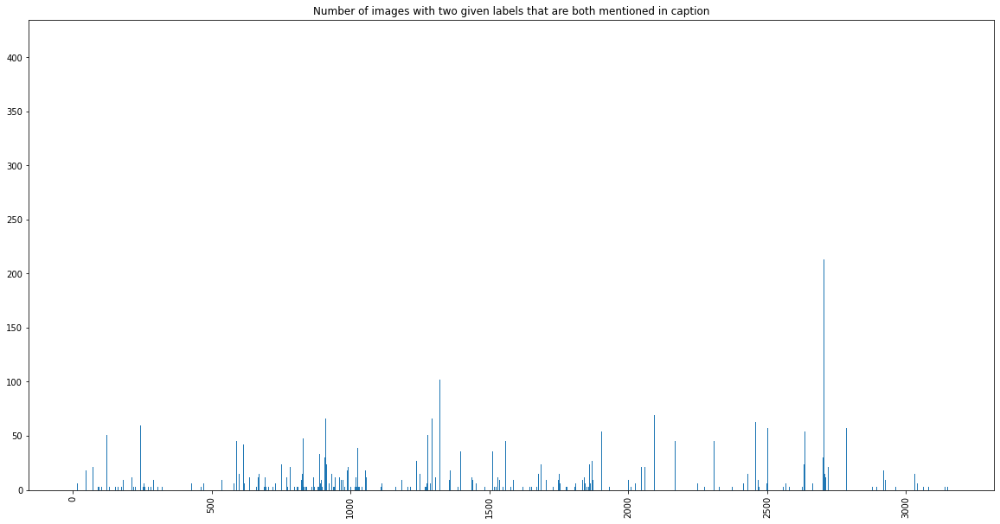

In [52]:
plt.figure(figsize=(20,10))
plt.xticks(rotation=90)
xs, ys  = [i for i in range(3160)], updated_label_pair_counts
plt.title('Number of images with two given labels that are both mentioned in caption')
plt.bar(xs,ys)

In [72]:
np.sum(np.where(np.array(updated_label_pair_counts) > 35, 1, 0))

93

In [54]:
np.argmax(np.array(updated_label_pair_counts))

2704

In [69]:
#print(label_pairs[2704])
#print(updated_label_pair_counts[2704])
#for i in updated_label_pair_trials[2704][15]:
#    plt.imshow(index_to_image(i))
#    plt.show()

In [70]:
3160*104*81*84

2236066560

In [78]:
#relevant_label_pairs is list of indices (relative to 3160) that have more than threshold images and whose single label averages also have more than threshold images
def get_relevant_label_pairs(threshold):
    numerous_label_pairs = []
    for i in range(3160):
        if updated_label_pair_counts[i] > threshold:
            numerous_label_pairs.append(i)
    relevant_label_pairs = []
    for numerous_label_pair in numerous_label_pairs:
        pair = label_pairs[numerous_label_pair]
        if totals[pair[0]] > threshold and totals[pair[1]] > threshold:
            relevant_label_pairs.append(numerous_label_pair)
    return relevant_label_pairs

relevant_label_pairs = get_relevant_label_pairs(40)
print(len(relevant_label_pairs))
for relevant_label_pair in relevant_label_pairs:
    print(label_pairs[relevant_label_pair])
    print(updated_label_pair_counts[relevant_label_pair])
    print(label_pairs[relevant_label_pair][0])
    print(totals[label_pairs[relevant_label_pair][0]])
    print(label_pairs[relevant_label_pair][1])
    print(totals[label_pairs[relevant_label_pair][1]])

('banana', 'person')
45
banana
66
person
123
('bed', 'cat')
114
bed
108
cat
147
('bed', 'dog')
81
bed
108
dog
117
('bed', 'person')
66
bed
108
person
123
('bed', 'teddy bear')
45
bed
108
teddy bear
108
('bench', 'cat')
42
bench
138
cat
147
('bench', 'person')
105
bench
138
person
123
('boat', 'dog')
48
boat
147
dog
117
('boat', 'person')
87
boat
147
person
123
('bus', 'car')
144
bus
90
car
42
('car', 'dog')
51
car
42
dog
117
('car', 'motorcycle')
66
car
42
motorcycle
102
('car', 'person')
78
car
42
person
123
('car', 'stop sign')
45
car
42
stop sign
156
('car', 'traffic light')
102
car
42
traffic light
150
('car', 'train')
42
car
42
train
381
('car', 'truck')
114
car
42
truck
96
('cat', 'suitcase')
60
cat
147
suitcase
57
('dog', 'person')
126
dog
117
person
123
('donut', 'person')
54
donut
102
person
123
('giraffe', 'zebra')
45
giraffe
600
zebra
420
('horse', 'person')
123
horse
189
person
123
('motorcycle', 'person')
159
motorcycle
102
person
123
('person', 'pizza')
69
person
123
pizz

In [87]:
loaded_data_double, loaded_session_double = None, 0
def get_double_label_averages():
    
    positive_resultant = np.zeros((81,104,83,25))
    global loaded_data_double
    global loaded_session_double
    
    positive_denominators = np.zeros(25)
    for session in range(40):
        start = time.time()
        session = session + 1
        if session != loaded_session_double:
            if session < 10:
                loaded_data_double = load_from_nii("betas/subj0"+str(subject)+"/betas_session0"+str(session)+".nii")
                loaded_session_double = session
            else:
                loaded_data_double = load_from_nii("betas/subj0"+str(subject)+"/betas_session"+str(session)+".nii")
                loaded_session_double = session

        trial_end = 750*session
        trial_start = trial_end - 750
        
        for tracker, relevant_label_pair in enumerate(relevant_label_pairs):
            relevant_trials = updated_label_pair_trials[relevant_label_pair]
            for relevant_trial in relevant_trials:
                if trial_start <= relevant_trial <= trial_end:
                    positive_denominators[tracker] += 1
                    positive_resultant[:,:,:,tracker] = positive_resultant[:,:,:,tracker] + loaded_data_double[:,:,:,relevant_trial%750]
        
        print(time.time() - start)
                    
    positive_resultant = positive_resultant.astype('float')
    
    for tracker in range(25):
        if positive_denominators[tracker] != 0:
            positive_resultant[:,:,:,tracker] = positive_resultant[:,:,:,tracker] / positive_denominators[tracker]

    return positive_resultant

#double_label_averages = get_double_label_averages()

In [89]:
def get_composed_voxels(label_one, label_two):
    return single_label_averages[:,:,:,all_labels.index(label_one)] + single_label_averages[:,:,:,all_labels.index(label_two)]

In [91]:
def compute_distances():
    distances = []
    for tracker, relevant_label_pair in enumerate(relevant_label_pairs):
        label_one = label_pairs[relevant_label_pair][0]
        label_two = label_pairs[relevant_label_pair][1]
        composition = get_composed_voxels(label_one, label_two)
        dist = scipy.spatial.distance.cosine(composition.flatten(), double_label_averages[:,:,:,tracker].flatten())
        distances.append(dist)
    return distances

distances = compute_distances()

In [92]:
distances

[0.3466144243804926,
 0.20433378748516406,
 0.26059848728607715,
 0.3018681736773964,
 0.34077560717549515,
 0.3112207683870638,
 0.2240164029010836,
 0.3586677172243271,
 0.24399047392409934,
 0.23627131545437507,
 0.3607417252045366,
 0.3019567848320901,
 0.31713899910261645,
 0.38795098600106703,
 0.26236705549933315,
 0.3654431034710769,
 0.256101545203021,
 0.2903299147408609,
 0.2224535806056982,
 0.30695788211302977,
 0.2684360516629761,
 0.19529407994406345,
 0.18478839226937382,
 0.2582228689193915,
 0.10898093699366762]

In [95]:
def get_sample_sizes():
    sample_sizes = []
    for relevant_label_pair in relevant_label_pairs:
        sample_sizes.append(updated_label_pair_counts[relevant_label_pair])
    return sample_sizes

sample_sizes = get_sample_sizes()

<BarContainer object of 25 artists>

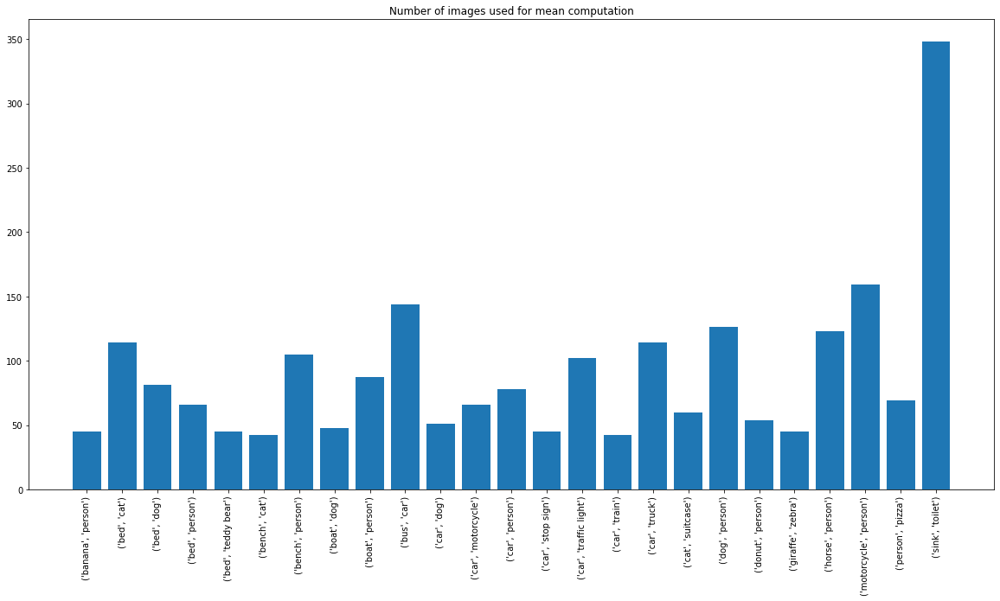

In [101]:
plt.figure(figsize=(20,10))
plt.xticks(rotation=90)
xs, ys  = [str(label_pairs[i]) for i in relevant_label_pairs], sample_sizes
plt.title('Number of images used for mean computation')
plt.bar(xs,ys)

In [100]:
[label_pairs[i] for i in relevant_label_pairs]

[('banana', 'person'),
 ('bed', 'cat'),
 ('bed', 'dog'),
 ('bed', 'person'),
 ('bed', 'teddy bear'),
 ('bench', 'cat'),
 ('bench', 'person'),
 ('boat', 'dog'),
 ('boat', 'person'),
 ('bus', 'car'),
 ('car', 'dog'),
 ('car', 'motorcycle'),
 ('car', 'person'),
 ('car', 'stop sign'),
 ('car', 'traffic light'),
 ('car', 'train'),
 ('car', 'truck'),
 ('cat', 'suitcase'),
 ('dog', 'person'),
 ('donut', 'person'),
 ('giraffe', 'zebra'),
 ('horse', 'person'),
 ('motorcycle', 'person'),
 ('person', 'pizza'),
 ('sink', 'toilet')]

In [117]:
import random 
# draws without replacement
# random_trials is a dict where i (relative to 25) maps to list of random indices that aren't double labelled images
def get_random_trials():
    random_trials = {}
    for i in range(25):
        num_to_sample = sample_sizes[i]
        exclude = set(updated_label_pair_trials[relevant_label_pairs[i]])
        sample_space = set([i for i in range(30000)]) - exclude
        random_trials[i] = random.sample(sample_space, num_to_sample)
    return random_trials

random_trials = get_random_trials()

In [121]:
loaded_data_random, loaded_session_random = None, 0

def get_random_averages():
    
    positive_resultant = np.zeros((81,104,83,25))
    global loaded_data_random
    global loaded_session_random
    
    positive_denominators = np.zeros(25)
    for session in range(40):
        start = time.time()
        session = session + 1
        if session != loaded_session_random:
            if session < 10:
                loaded_data_random = load_from_nii("betas/subj0"+str(subject)+"/betas_session0"+str(session)+".nii")
                loaded_session_random = session
            else:
                loaded_data_random = load_from_nii("betas/subj0"+str(subject)+"/betas_session"+str(session)+".nii")
                loaded_session_random = session

        trial_end = 750*session
        trial_start = trial_end - 750
        
        for i in range(25):
            random_trials_list = random_trials[i]
            for random_trial in random_trials:
                if trial_start <= random_trial <= trial_end:
                    positive_denominators[i] += 1
                    positive_resultant[:,:,:,i] = positive_resultant[:,:,:,i] + loaded_data_random[:,:,:,random_trial]
       
        print(time.time() - start)
                    
    positive_resultant = positive_resultant.astype('float')
    
    for tracker in range(25):
        if positive_denominators[tracker] != 0:
            positive_resultant[:,:,:,tracker] = positive_resultant[:,:,:,tracker] / positive_denominators[tracker]

    return positive_resultant

#random_averages = get_random_averages()
#random_averages_nifti = nib.Nifti1Image(random_averages, affine=np.eye(4))
#nib.save(random_averages_nifti, 'random_averages.nii')

In [122]:
def compute_distances_random():
    distances_random = []
    for tracker, relevant_label_pair in enumerate(relevant_label_pairs):
        label_one = label_pairs[relevant_label_pair][0]
        label_two = label_pairs[relevant_label_pair][1]
        composition = get_composed_voxels(label_one, label_two)
        dist = scipy.spatial.distance.cosine(composition.flatten(), random_averages[:,:,:,tracker].flatten())
        distances_random.append(dist)
    return distances_random

distances_random = compute_distances_random()

In [124]:
distances_random

[0.5216632748516712,
 0.5054836822284049,
 0.5090646249996471,
 0.5179288331071941,
 0.5146354330125229,
 0.4906743995624161,
 0.5047782900390035,
 0.49329039675064035,
 0.5011359387679859,
 0.546356327577455,
 0.5485511462195811,
 0.5442569976931653,
 0.5582789309277411,
 0.5577174975116916,
 0.5585637847463916,
 0.5507535251485713,
 0.5563129391657533,
 0.5034018236454256,
 0.5084909000831996,
 0.5139577470683588,
 0.4809411544331037,
 0.5054280084654291,
 0.5012680034958135,
 0.49537083704225804,
 0.5159419107898942]

Blue: distance of composition to average of random trials (with same number of addends and excluding double-labelled images)
Orange: distance of composition to average of double-labelled images


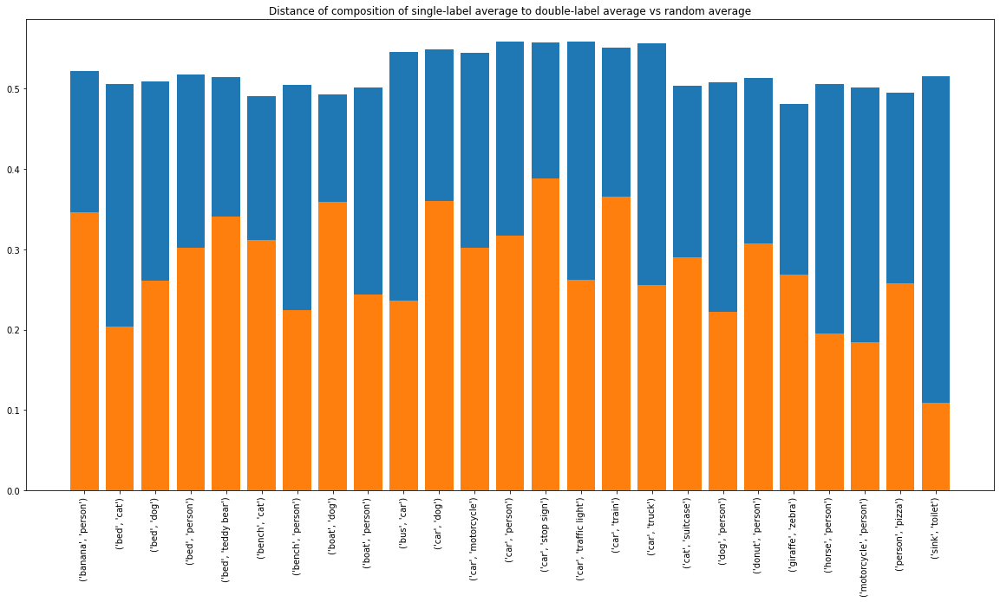

In [127]:
plt.figure(figsize=(20,10))
plt.xticks(rotation=90)
xs, ys  = [str(label_pairs[i]) for i in relevant_label_pairs], distances
ysn = distances_random
plt.title('Distance of composition of single-label average to double-label average vs random average')
plt.bar(xs, ysn)
plt.bar(xs,ys)
print('Blue: distance of composition to average of random trials (with same number of addends and excluding double-labelled images)')
print('Orange: distance of composition to average of double-labelled images')

## Search over trials

In [44]:
def compute_nn():
    gold_statistics = []
    for num, count in enumerate(label_pair_counts):
        if count > 400:
            start = time.time()
            label_one, label_two = label_pairs[num]
            composed_voxels = get_composed_voxels(label_one,label_two)
            dists, idxs = nearest_neighbor(composed_voxels)
            print("Composition of "+label_one+" and "+label_two)
            print(' ')
            print("Top 10 Nearest Neighbors:")
            gold_count = 0
            for j, idx in enumerate(idxs):
                plt.imshow(index_to_image(idx))
                plt.show()
                print("Trial: "+str(idx))
                print("Cosine distance: "+str(dists[j]))
                if idx in label_pair_trials[num]:
                    print("GOLD IMAGE")
                    gold_count += 1
            print("Total gold in top 10: "+str(gold_count))
            print("Total gold in search space: "+ str(count))
            print("Computation time (in minutes): "+str((time.time()-start)/60))
            print("________________________________________________________________")
            print(' ')
            gold_statistics.append((gold_count, count))
    print(gold_statistics)
    return gold_statistics

results = compute_nn()

KeyboardInterrupt: 

In [129]:
import json

def modified_nearest_neighbor(brain_vector, gold_indices):
    brain_vector = brain_vector.flatten()
    distances = np.ones(10)*999999999999999999999
    indices = np.zeros(10)
    all_distances = []
    gold_distances = []
    for session in range(40):
        #start = time.time()
        session += 1
        if session < 10:
            loaded_data = load_from_nii("betas/subj0"+str(subject)+"/betas_session0"+str(session)+".nii")
        else:
            loaded_data = load_from_nii("betas/subj0"+str(subject)+"/betas_session"+str(session)+".nii")
        for trial in range(750):
            dist = scipy.spatial.distance.cosine(loaded_data[:,:,:,trial].flatten(), brain_vector)
            all_distances.append(dist)
            #np.linalg.norm(loaded_data[:,:,:,trial] - brain_vector)
            idx = 750*(session-1) + trial
            if idx in gold_indices:
                gold_distances.append(dist)
            for n in range(10):
                if dist < distances[n]:
                    distances[n] = dist
                    indices[n] = idx
                    break
        #print(time.time() - start)
    indices = indices.astype('int')
    return distances, indices, all_distances, gold_distances

dists, idxs, all_dists, gold_dists = modified_nearest_neighbor(get_composed_voxels('toilet','sink'), updated_label_pair_trials[label_pairs.index(('sink','toilet'))])

with open('sink_toilet_all_dists.json', 'w') as f:
    json.dump(all_dists, f)
    
with open('sink_toilet_gold_dists.json', 'w') as f:
    json.dump(gold_dists, f)

x,y  = np.histogram(all_dists, bins=75, normed=None, weights=None, density=None)
plt.plot(y[:-1],x)
plt.show()

x,y  = np.histogram(gold_dists, bins=75, normed=None, weights=None, density=None)
plt.plot(y[:-1],x)
plt.show()

#plt.plot(all_dists, np.zeros((len(all_dists))), 'x')
#plt.show()

#plt.plot(gold_dists, np.zeros((len(gold_dists))), 'o')
#plt.show()

#plt.plot(all_dists, np.zeros((len(all_dists))), 'x')
#plt.plot(gold_dists, np.zeros((len(gold_dists))), 'o')
#plt.show()

KeyboardInterrupt: 

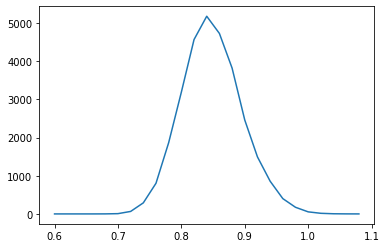

In [42]:
x,y  = np.histogram(all_dists, bins=25, range=(.6,1.1 ), normed=None, weights=None, density=None)
plt.plot(y[:-1],x)
plt.show()

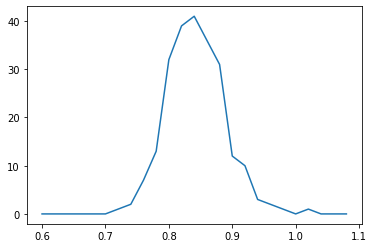

In [43]:
x,y  = np.histogram(gold_dists, bins=25, range=(.6,1.1 ), normed=None, weights=None, density=None)
plt.plot(y[:-1],x)
plt.show()